## Customer Segmentation Analysis Using Unsupervised Machine Learning Techniques

Final Project By: Iyiola Zainab Ololade

## Brief Introduction 

Customer segmentation is an important strategic decision-making process used by various 
financial institutions to divide customers into various groups based on several relevant factors such 
as behaviors, preferences and so on. It is used in tailoring services and marketing efforts to distinct 
customer groups. Traditional methods of customer segmentation often rely on pre-defined rules 
and basic statistical models that do not adequately capture the complexity and variability of 
customer behaviors. Unsupervised machine learning algorithms has been leveraged in recent years 
to create dynamic and accurate customer segments which would enable financial institutions to 
provide more personalized services and more importantly optimize their marketing strategies. 

The main objectives of this project are to: 
* Develop comprehensive customer segmentation models. 
* Evaluate model performance. 
* Offer insights and suggestions for leveraging machine learning in customer segmentation analysis.

## Data Source 

The dataset used for this project is gotten from: https://www.kaggle.com/arjunbhasin2013/ccdata

 ## Data Description

* CUST_ID: Identification of Credit Card holder 
* BALANCE: Balance amount left in customer's account to  make purchases
* BALANCE_FREQUENCY: How frequently the Balance is  updated, score between 0 and 1 (1 = frequently updated, 0 = not frequently updated)
* PURCHASES: Amount of purchases made from account
* ONEOFFPURCHASES: Maximum purchase amount done in one-go
* INSTALLMENTS_PURCHASES: Amount of purchase done in installment
* CASH_ADVANCE: Cash in advance given by the user
* PURCHASES_FREQUENCY: How frequently the Purchases are being made, score between 0 and 1 (1 = frequently purchased, 0 = not frequently purchased)
* ONEOFF_PURCHASES_FREQUENCY: How  frequently Purchases are happening in one-go (1 = frequently purchased, 0 = not frequently purchased)
* PURCHASES_INSTALLMENTS_FREQUENCY: How frequently purchases in installments are being done (1 = frequently done, 0 = not frequently done)
* CASH_ADVANCE_FREQUENCY: How  frequently the cash in advance being paid
* CASH_ADVANCE_TRX: Number of Transactions made with "Cash in Advance"
* PURCHASES_TRX: Number of purchase  transactions made
* CREDIT_LIMIT: Limit of Credit Card for user
* PAYMENTS: Amount of Payment done by user
* MINIMUM_PAYMENTS: Minimum amount of  payments made by user  
* PRC_FULL_PAYMENT: Percent of full payment paid by user
* TENURE: Tenure of credit card service for user

## Importing Dataset & Useful Libraries 

In [1]:
#import libraries 

import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import seaborn as sns
import missingno as msno
import matplotlib.pyplot as plt 
import plotly as py
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot, plot
import plotly.express as px


In [2]:
#import dataset

marketing_data = pd.read_csv('Marketing_data.csv')

marketing_data


,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


In [3]:
# View statistical description of the dataframe

print(marketing_data.info())
marketing_data.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


We can see that our dataset has a variety of data type from integers, to objects, to floats etc. This data type will be useful to us when handling the dataset at a later stage in this project.

## Data Preprocessing

### Missing Values Treatment 

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64


<Axes: >

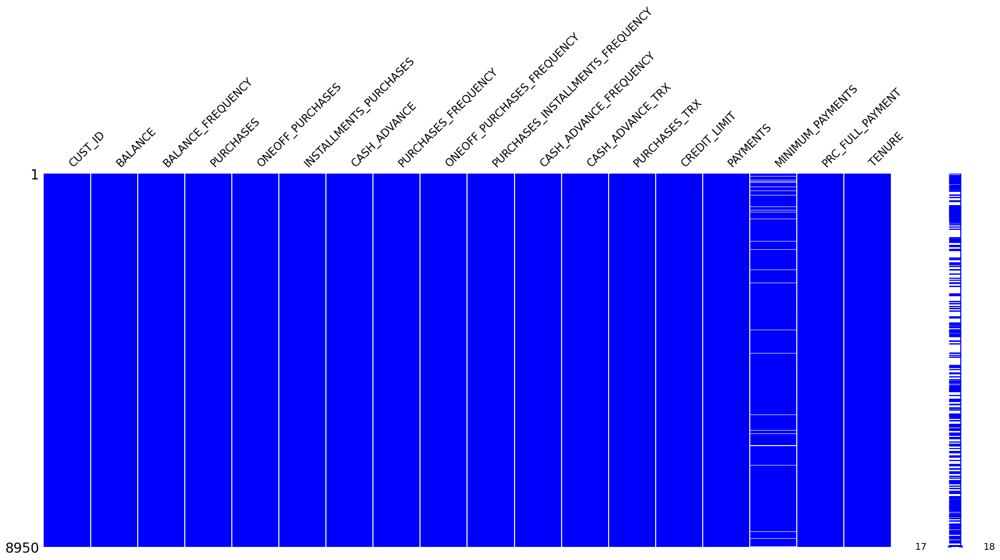

In [4]:
# Viewing missing values
print(marketing_data.isna().sum())
msno.matrix(marketing_data, color=(0, 0, 1)) #RGB for color blue

The minimum payment column has the most mising data. 

I will  first drop the cust_id column because it is just a unique identifier for each customer and does not have any impact on the models.

In [5]:
marketing_data.drop('CUST_ID', axis=1, inplace = True)

### Outlier Detection and Treatment 

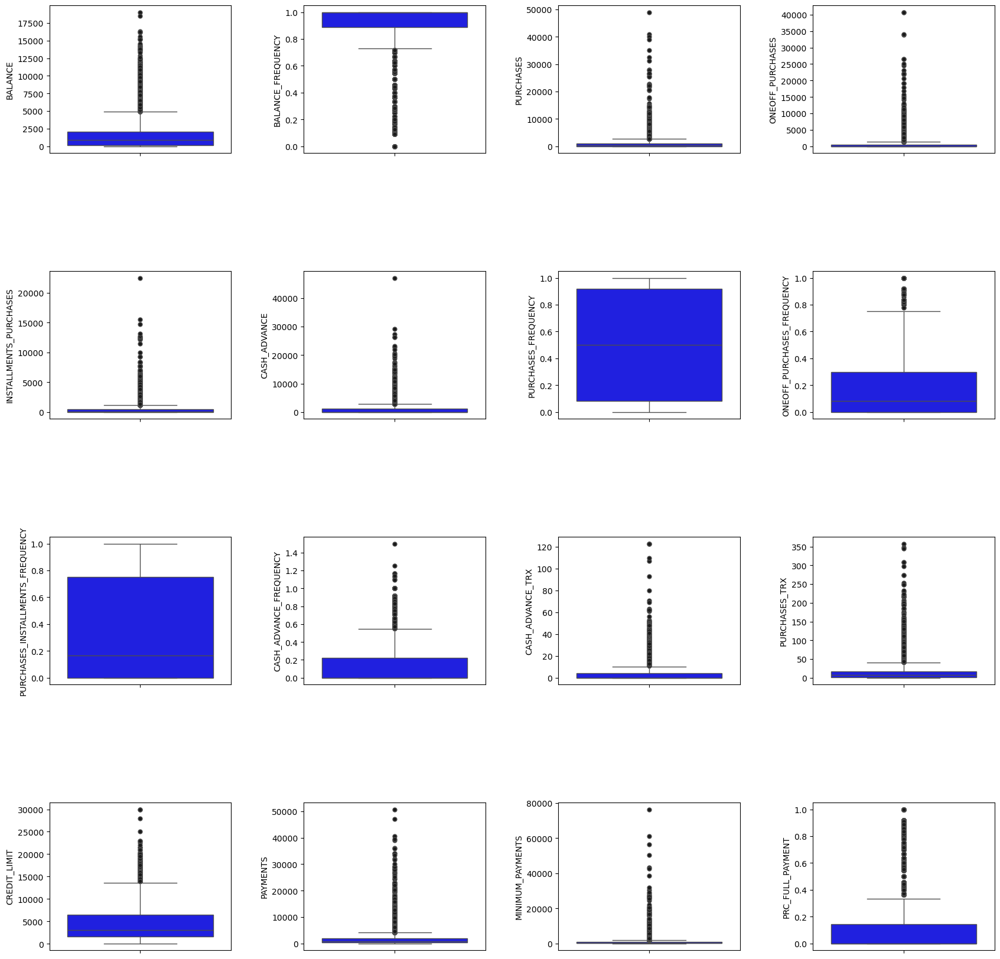

In [6]:
#Boxplot for visualization

plt.subplots(nrows=4 , ncols=4 , figsize=(20,20))
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.8)

for i in range (len(marketing_data.columns)-1):
    
    plt.subplot(4,4,i+1)
    sns.boxplot(marketing_data[marketing_data.columns[i]], color='blue',flierprops = dict(markerfacecolor = '0.10', markersize = 5))
   

In [7]:
#finding outliers base on the Inter Quantile Range(IQR)

Q1 = marketing_data.quantile(0.25)
Q3 = marketing_data.quantile(0.75)
IQR = Q3 - Q1

count_out = marketing_data[(marketing_data <  (Q1 - 1.5 * IQR)) | (marketing_data > (Q3 + 1.5 * IQR))].count()


marketing_data_count = pd.DataFrame(count_out, columns=['count'])
marketing_data_count

,count
BALANCE,695
BALANCE_FREQUENCY,1493
PURCHASES,808
ONEOFF_PURCHASES,1013
INSTALLMENTS_PURCHASES,867
CASH_ADVANCE,1030
PURCHASES_FREQUENCY,0
ONEOFF_PURCHASES_FREQUENCY,782
PURCHASES_INSTALLMENTS_FREQUENCY,0
CASH_ADVANCE_FREQUENCY,525


Replotting after countout. Countout was used to see the number of outliers present in the dataset.The outliers WERE not removed but not shown in this code. 

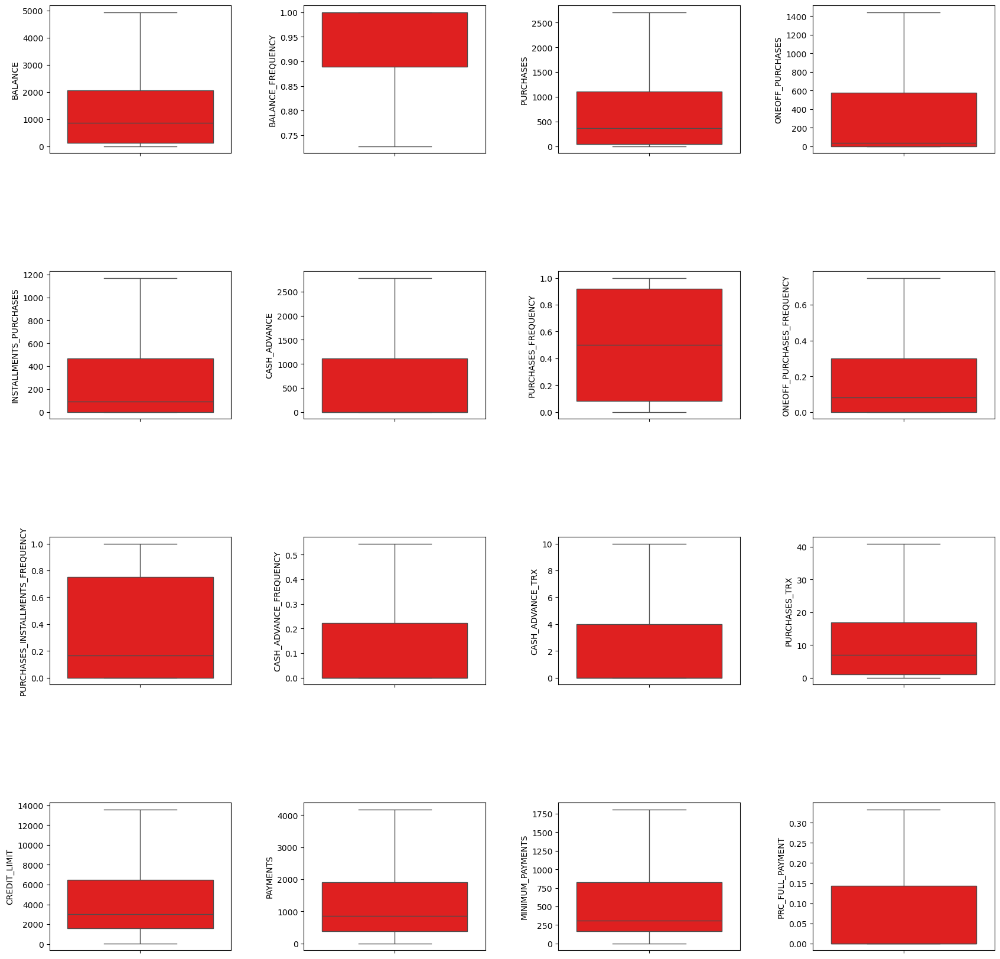

In [8]:
#bloxplots

plt.subplots(nrows=4 , ncols=4 , figsize=(20,20))
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.8)

for i in range (len(marketing_data.columns)-1):
    plt.subplot(4,4,i+1)
    sns.boxplot(marketing_data[marketing_data.columns[i]],showfliers = False ,color='red')

### Missing Values treatment 

As seen previously from the missingno plot, 2 columns have missing values. 'CREDIT_LIMIT' has a low number of outliers but 'MINIMUM_PAYMENT' has high number. The disparity in the amount of missingness in these columns will result in different missing values treatment. I will eliminate the one with low missigness and an input method will be applied to the one with high missingness. 

In [9]:
# 'CREDIT_LIMIT' column(this column has one missing value)

missing_value1 = pd.isnull(marketing_data["CREDIT_LIMIT"])
marketing_data[missing_value1]

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
5203,18.400472,0.166667,0.0,0.0,0.0,186.853063,0.0,0.0,0.0,0.166667,1,0,NaN,9.040017,14.418723,0.0,6


The 'CREDIT_LIMIT' column has only one missing column. Hence I will proceed to drop it.

In [10]:
marketing_data.drop([5203], axis=0, inplace=True)
marketing_data.reset_index( inplace = True)
marketing_data.drop('index',axis=1,inplace = True)
marketing_data

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8944,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8945,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8946,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8947,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


Now, the mising row has been removed.

The 'MINIMUM_PAYMENT' column however has high missingness and this will be dealt with in a different manner.

In [11]:
marketing_data[['PAYMENTS', 'MINIMUM_PAYMENTS']][marketing_data['MINIMUM_PAYMENTS'].isna()]

,PAYMENTS,MINIMUM_PAYMENTS
3,0.000000,NaN
45,0.000000,NaN
47,0.000000,NaN
54,417.016763,NaN
55,0.000000,NaN
...,...,...
8918,0.000000,NaN
8928,0.000000,NaN
8934,0.000000,NaN
8943,0.000000,NaN


Instead of deleting the columns, I will make columns which have mising values to be = 0. 

In [12]:
# rows where PAYMENTS's values are less than MINIMUM_PAYMENTS

print('Shape:', marketing_data[['PAYMENTS', 'MINIMUM_PAYMENTS']][(marketing_data['MINIMUM_PAYMENTS'].notna()) & (marketing_data['PAYMENTS'] < marketing_data['MINIMUM_PAYMENTS'])].shape)
marketing_data[['PAYMENTS', 'MINIMUM_PAYMENTS']][(marketing_data['MINIMUM_PAYMENTS'].notna()) & (marketing_data['PAYMENTS'] < marketing_data['MINIMUM_PAYMENTS'])]

Shape: (2364, 2)


,PAYMENTS,MINIMUM_PAYMENTS
2,622.066742,627.284787
5,1400.057770,2407.246035
10,1083.301007,2172.697765
14,805.647974,989.962866
15,1993.439277,2109.906490
...,...,...
8932,106.138603,337.294767
8938,72.530037,110.950798
8946,81.270775,82.418369
8947,52.549959,55.755628


For filling the missing values of the MINIMUM_PAYMENTS columns, the following is done:
* If it has the value of PAYMENTS and is equal to zero, we consider the zero for it
* If PAYMENTS is a value between 0 and PAYMENTS_MEAN, we use PAYMENTS
* Otherwise, we use PAYMENTS_MEAN


In [13]:
minpay = marketing_data['MINIMUM_PAYMENTS'].copy() # copy of MINIMUM_PAYMENTS
payments_mean = np.mean(marketing_data['PAYMENTS']) # mean value of PAYMENTS

i = 0
for payments, minpayments in zip(marketing_data['PAYMENTS'], marketing_data['MINIMUM_PAYMENTS'].isna()):
    if (payments == 0) and (minpayments == True):
        minpay[i] = 0
    elif (0 < payments < payments_mean) and (minpayments == True): 
        minpay[i] = payments
    elif minpayments == True: 

        minpay[i] = payments_mean
    i += 1
    
print(f'Missing (before): {marketing_data.isna().sum().sum()}')
print(f'Missing (after): {minpay.isna().sum().sum()}')

marketing_data['MINIMUM_PAYMENTS'] = minpay.copy()

Missing (before): 313
Missing (after): 0


It can be seen nowthat the missing values have now been replaced and nothing is missing anymore.

To further reduce the noise in the dataset, I will be dropping some values set above certain thresholds.

In [14]:
#Dropping some of outliers 
marketing_data = marketing_data[(marketing_data['BALANCE']<15000)]
marketing_data = marketing_data[(marketing_data['PURCHASES']<40000)]
marketing_data = marketing_data[(marketing_data['ONEOFF_PURCHASES']<30000)]
marketing_data = marketing_data[(marketing_data['INSTALLMENTS_PURCHASES']<20000)]
marketing_data = marketing_data[(marketing_data['CASH_ADVANCE']<40000)]
marketing_data = marketing_data[(marketing_data['MINIMUM_PAYMENTS']<60000)]

In [15]:
marketing_data.reset_index(inplace=True)
marketing_data.drop('index',axis=1,inplace = True)
marketing_data

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,0.000000,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8926,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8927,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,275.861322,0.000000,6
8928,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8929,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


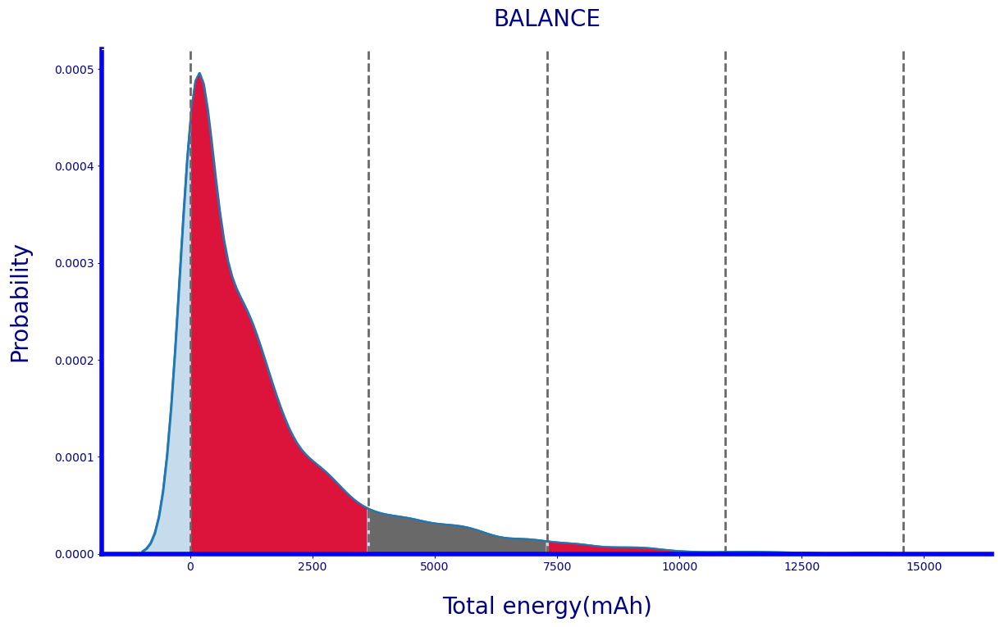



 Area Under the cureve of BALANCE between 0.0 and 3645.4: 0.7156
 Area Under the cureve of BALANCE between 3645.4 and 7290.7: 0.0983
 Area Under the cureve of BALANCE between 7290.7 and 10936.1: 0.0216
 Area Under the cureve of BALANCE between 10936.1 and 14581.5 mAh: 0.004

 
 
 



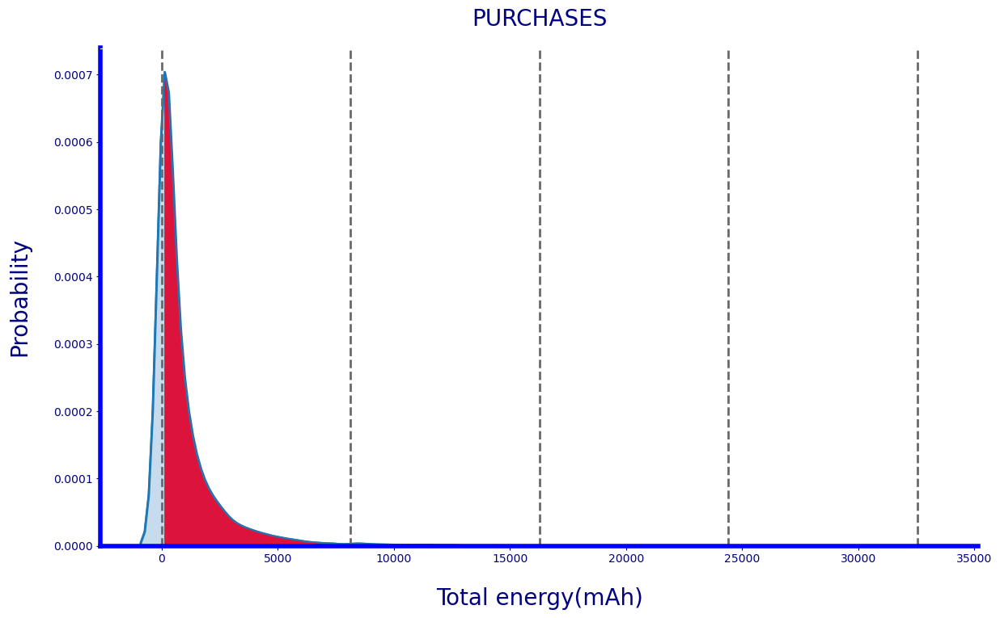



 Area Under the cureve of PURCHASES between 0.0 and 8134.9: 0.7029
 Area Under the cureve of PURCHASES between 8134.9 and 16269.9: 0.0099
 Area Under the cureve of PURCHASES between 16269.9 and 24404.8: 0.0009
 Area Under the cureve of PURCHASES between 24404.8 and 32539.8 mAh: 0.0009

 
 
 



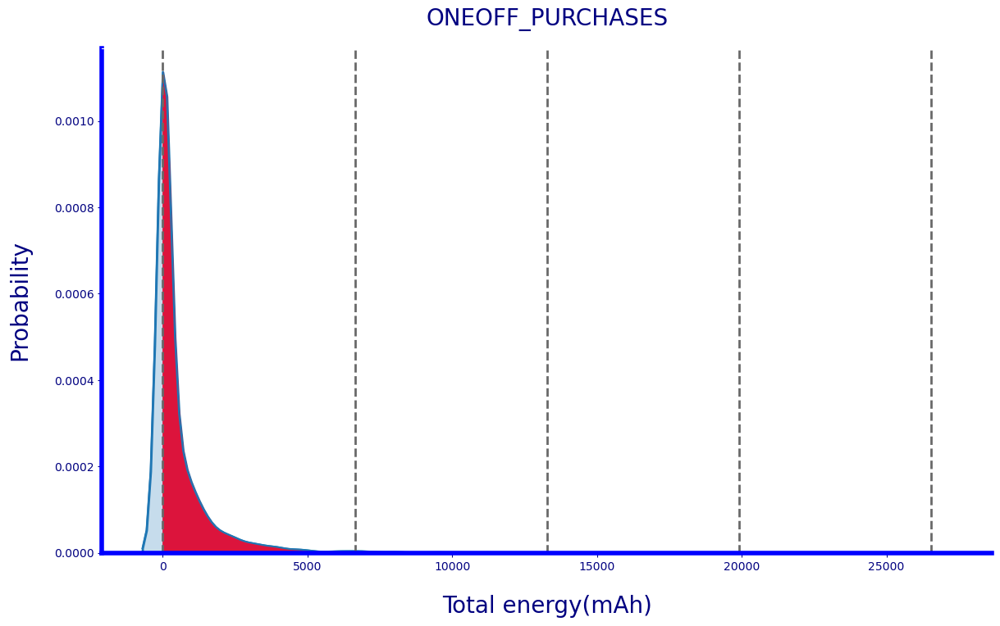



 Area Under the cureve of ONEOFF_PURCHASES between 0.0 and 6636.9: 0.6884
 Area Under the cureve of ONEOFF_PURCHASES between 6636.9 and 13273.7: 0.0072
 Area Under the cureve of ONEOFF_PURCHASES between 13273.7 and 19910.6: 0.0009
 Area Under the cureve of ONEOFF_PURCHASES between 19910.6 and 26547.4 mAh: 0.0008

 
 
 



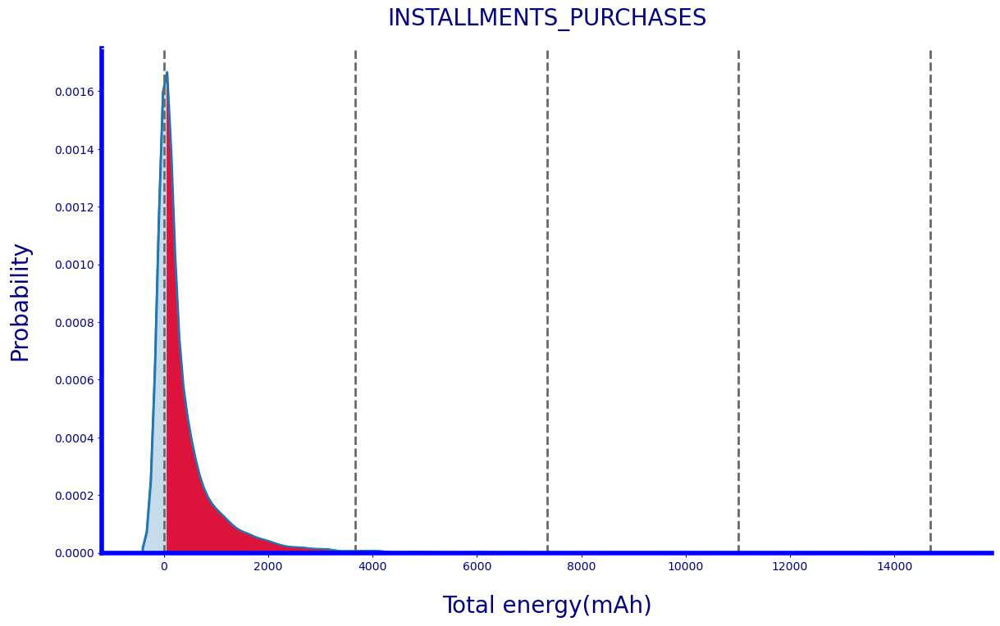



 Area Under the cureve of INSTALLMENTS_PURCHASES between 0.0 and 3671.5: 0.6337
 Area Under the cureve of INSTALLMENTS_PURCHASES between 3671.5 and 7343.1: 0.0085
 Area Under the cureve of INSTALLMENTS_PURCHASES between 7343.1 and 11014.6: 0.001
 Area Under the cureve of INSTALLMENTS_PURCHASES between 11014.6 and 14686.1 mAh: 0.0008

 
 
 



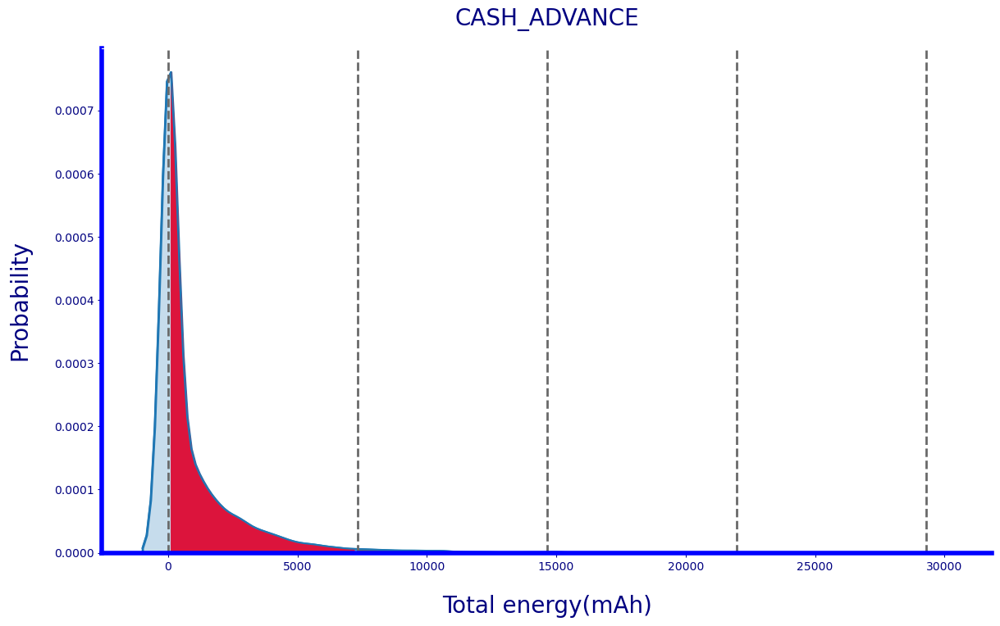



 Area Under the cureve of CASH_ADVANCE between 0.0 and 7320.5: 0.5979
 Area Under the cureve of CASH_ADVANCE between 7320.5 and 14641.1: 0.0171
 Area Under the cureve of CASH_ADVANCE between 14641.1 and 21961.6: 0.002
 Area Under the cureve of CASH_ADVANCE between 21961.6 and 29282.1 mAh: 0.0006

 
 
 



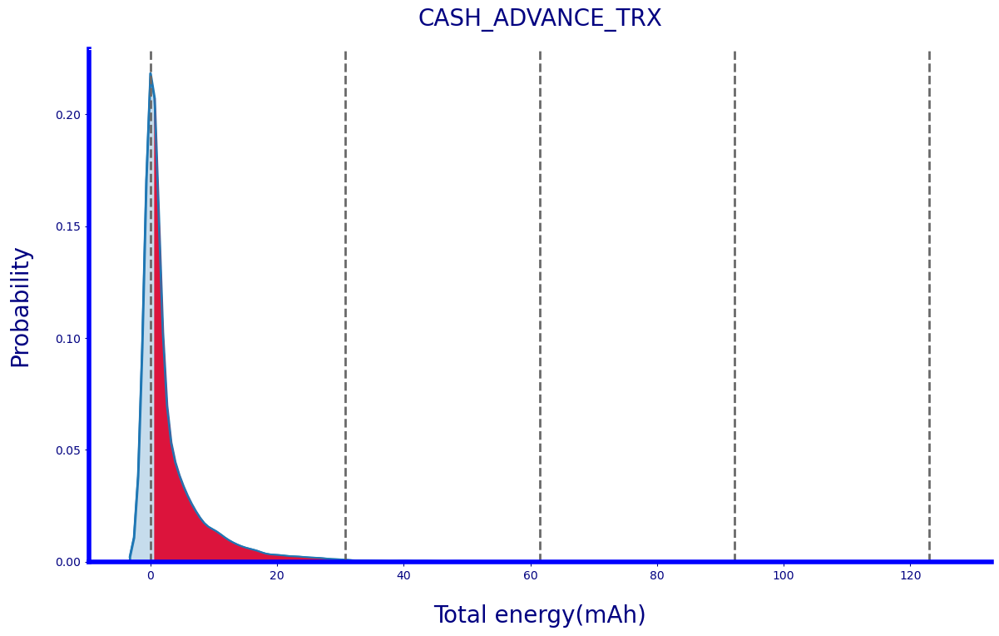



 Area Under the cureve of CASH_ADVANCE_TRX between 0 and 30.8: 0.5744
 Area Under the cureve of CASH_ADVANCE_TRX between 30.8 and 61.5: 0.007
 Area Under the cureve of CASH_ADVANCE_TRX between 61.5 and 92.2: 0.0007
 Area Under the cureve of CASH_ADVANCE_TRX between 92.2 and 123 mAh: 0.0004

 
 
 



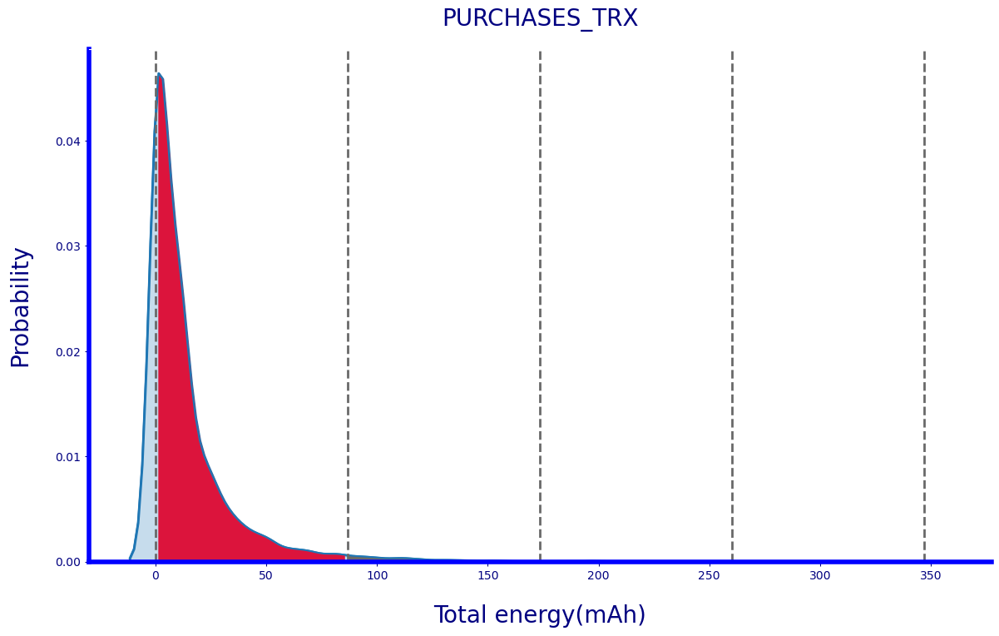



 Area Under the cureve of PURCHASES_TRX between 0 and 86.8: 0.7405
 Area Under the cureve of PURCHASES_TRX between 86.8 and 173.5: 0.0179
 Area Under the cureve of PURCHASES_TRX between 173.5 and 260.2: 0.0025
 Area Under the cureve of PURCHASES_TRX between 260.2 and 347 mAh: 0.0006

 
 
 



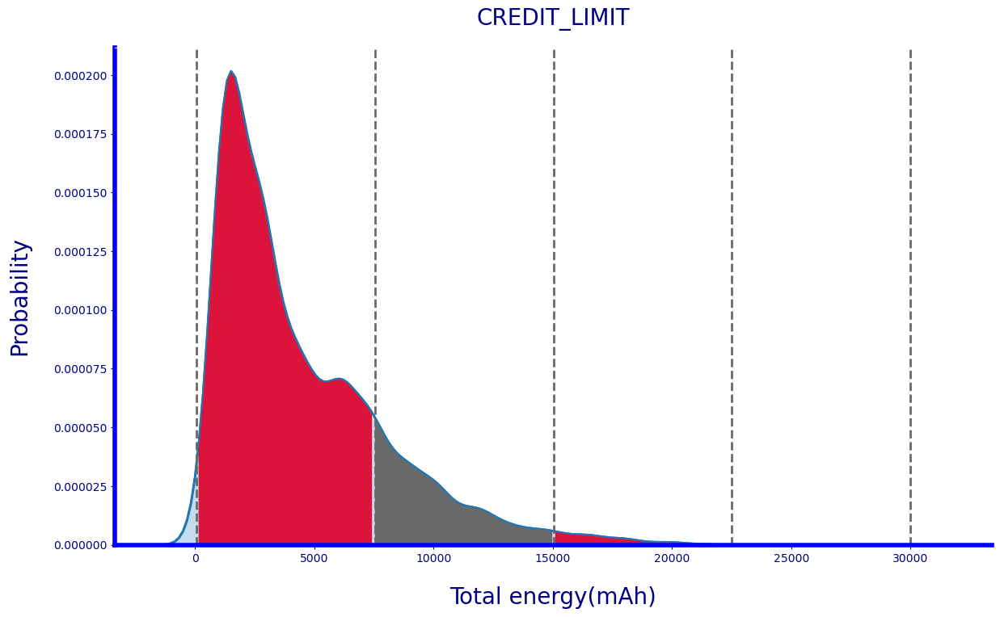



 Area Under the cureve of CREDIT_LIMIT between 50.0 and 7537.5: 0.7979
 Area Under the cureve of CREDIT_LIMIT between 7537.5 and 15025.0: 0.1595
 Area Under the cureve of CREDIT_LIMIT between 15025.0 and 22512.5: 0.0164
 Area Under the cureve of CREDIT_LIMIT between 22512.5 and 30000.0 mAh: 0.0004

 
 
 



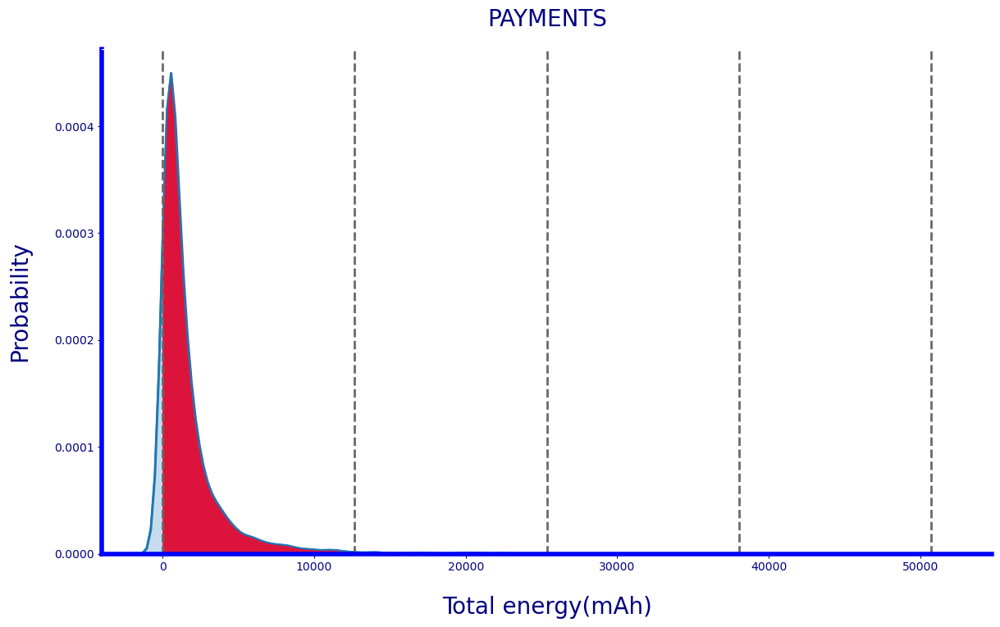



 Area Under the cureve of PAYMENTS between 0.0 and 12680.4: 0.8744
 Area Under the cureve of PAYMENTS between 12680.4 and 25360.7: 0.0081
 Area Under the cureve of PAYMENTS between 25360.7 and 38041.1: 0.0016
 Area Under the cureve of PAYMENTS between 38041.1 and 50721.5 mAh: 0.0003

 
 
 



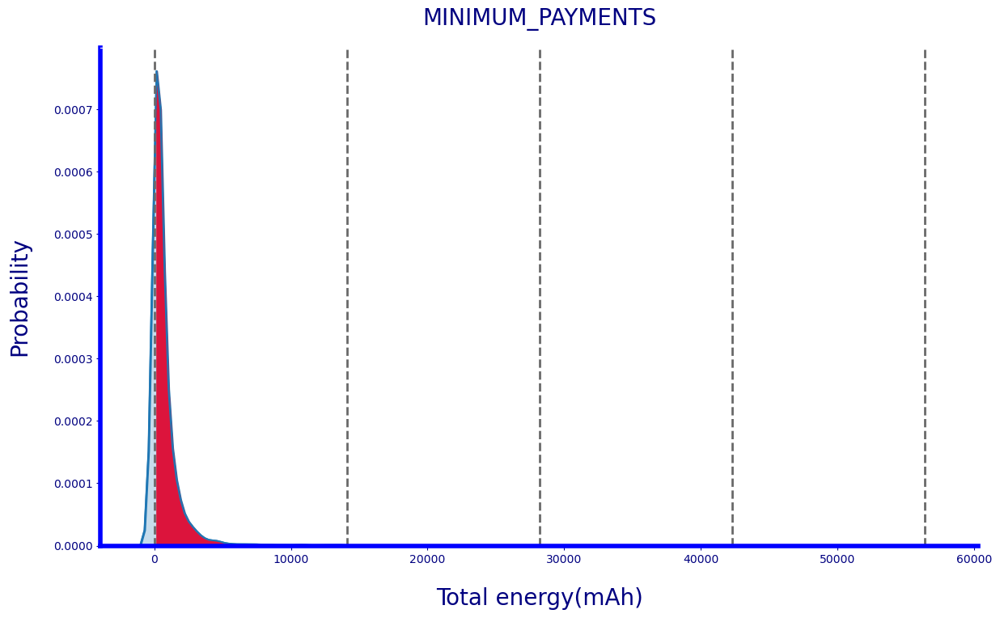



 Area Under the cureve of MINIMUM_PAYMENTS between 0.0 and 14092.5: 0.6929
 Area Under the cureve of MINIMUM_PAYMENTS between 14092.5 and 28185.0: 0.0032
 Area Under the cureve of MINIMUM_PAYMENTS between 28185.0 and 42277.5: 0.0005
 Area Under the cureve of MINIMUM_PAYMENTS between 42277.5 and 56370.0 mAh: 0.0003

 
 
 



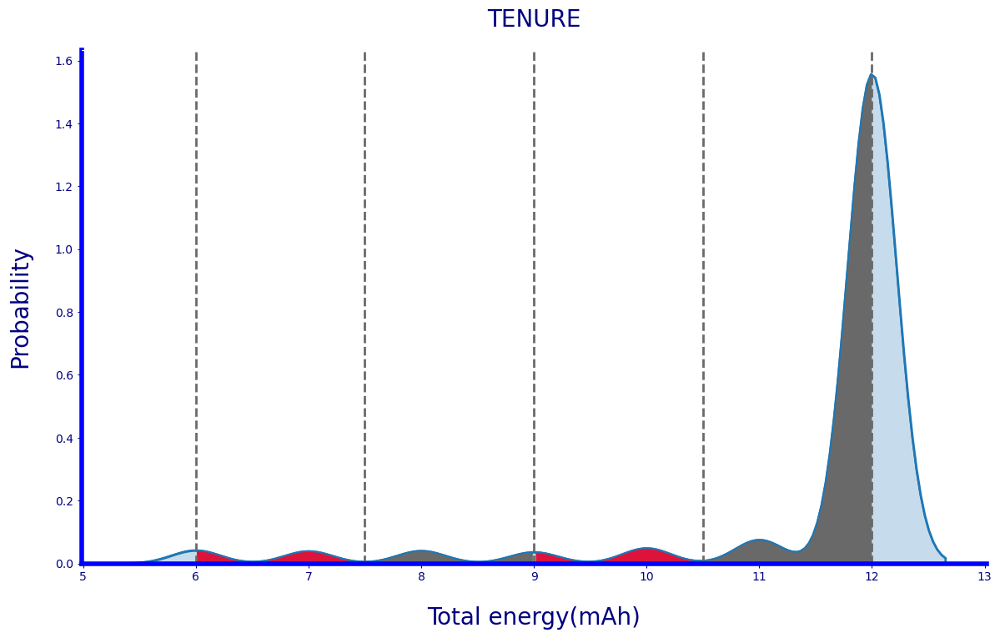



 Area Under the cureve of TENURE between 6 and 7.5: 0.0321
 Area Under the cureve of TENURE between 7.5 and 9.0: 0.0309
 Area Under the cureve of TENURE between 9.0 and 10.5: 0.0356
 Area Under the cureve of TENURE between 10.5 and 12 mAh: 0.4489

 
 
 



In [16]:
#Dividing the density distribution diagram into specific sections

n_columns=["BALANCE","PURCHASES","ONEOFF_PURCHASES","INSTALLMENTS_PURCHASES","CASH_ADVANCE","CASH_ADVANCE_TRX",
          "PURCHASES_TRX","CREDIT_LIMIT","PAYMENTS","MINIMUM_PAYMENTS","TENURE"]

for i in n_columns:
    plt.figure(figsize=(14, 8))

    # Plot density curve 
    sns.kdeplot(marketing_data[i], linewidth=2, fill=True)
    ax = sns.kdeplot(marketing_data[i])

    # Get all the lines used to draw density curve 
    kde_lines = ax.get_lines()[-1]
    kde_a, kde_b = kde_lines.get_data()
    kde_c, kde_d = kde_lines.get_data()
    kde_e, kde_f = kde_lines.get_data()
    kde_g, kde_h = kde_lines.get_data()

    # Filter 
    mask1 = (kde_a >= marketing_data[i].min()) & (kde_a <((marketing_data[i].max()-marketing_data[i].min())/4)+marketing_data[i].min())
    mask2= (kde_c >= ((marketing_data[i].max()-marketing_data[i].min())/4)+marketing_data[i].min()) & (kde_c <(((marketing_data[i].max()-marketing_data[i].min())/4)*2)+marketing_data[i].min())
    mask3= (kde_e >= (((marketing_data[i].max()-marketing_data[i].min())/4)*2)+marketing_data[i].min()) & (kde_e < (((marketing_data[i].max()-marketing_data[i].min())/4)*3)+marketing_data[i].min())
    mask4= (kde_g >= (((marketing_data[i].max()-marketing_data[i].min())/4)*3)+marketing_data[i].min()) & (kde_g <marketing_data[i].max())

    filled_a, filled_b = kde_a[mask1], kde_b[mask1]
    filled_c, filled_d = kde_c[mask2], kde_d[mask2]
    filled_e, filled_f = kde_e[mask3], kde_f[mask3]
    filled_g, filled_h = kde_g[mask4], kde_h[mask4]

    # Shade the partial region 

    ax.fill_between(filled_a, y1=filled_b ,color="crimson")
    ax.fill_between(filled_c, y1=filled_d,color="dimgray")
    ax.fill_between(filled_e, y1=filled_f,color="crimson")
    ax.fill_between(filled_g, y1=filled_h,color= "dimgray")

    # Vertical lines 

    plt.axvline(x=marketing_data[i].min(), linewidth=2, linestyle='--', color="DimGray")
    plt.axvline(x=((marketing_data[i].max()-marketing_data[i].min())/4)+marketing_data[i].min(), linewidth=2, linestyle='--', color="DimGray")
    plt.axvline(x=(((marketing_data[i].max()-marketing_data[i].min())/4)*2)+marketing_data[i].min(), linewidth=2, linestyle='--', color="DimGray")
    plt.axvline(x=(((marketing_data[i].max()-marketing_data[i].min())/4)*3)+marketing_data[i].min(), linewidth=2, linestyle='--', color="DimGray")
    plt.axvline(x=marketing_data[i].max(), linewidth=2, linestyle='--', color="DimGray")

    plt.title( i, pad=20 , size=20 , color= "navy")
    plt.xlabel("Total energy(mAh)", labelpad=20 , size=20)
    plt.ylabel("Probability", labelpad=20 , size=20)
    
    ax.spines['bottom'].set_color('blue')
    ax.spines['top'].set_color('white') 
    ax.spines['right'].set_color('white')
    ax.spines['left'].set_linewidth(4)
    ax.spines['bottom'].set_linewidth(4)
    ax.spines['left'].set_color('blue')
    ax.xaxis.label.set_color('navy')
    ax.yaxis.label.set_color('navy')
    ax.tick_params(colors="navy", which='both')  # 'both' refers to minor and major axes

    
    
    plt.show()

    area1 = np.trapz(filled_b, filled_a)
    area2 = np.trapz(filled_d, filled_c)
    area3 = np.trapz(filled_f, filled_e)
    area4 = np.trapz(filled_h, filled_g)
    
  
   
  
    from colorama import Fore
  
    print('\n')
    print(Fore.BLUE , f"Area Under the cureve of {i} between {marketing_data[i].min()} and {round(((marketing_data[i].max()-marketing_data[i].min())/4)+marketing_data[i].min(),1)}: {area1.round(4)}")
    print(Fore.RED , f"Area Under the cureve of {i} between {round(((marketing_data[i].max()-marketing_data[i].min())/4)+marketing_data[i].min(),1)} and {round((((marketing_data[i].max()-marketing_data[i].min())/4)*2)+marketing_data[i].min(),1)}: {area2.round(4)}")
    print(Fore.BLUE, f"Area Under the cureve of {i} between {round((((marketing_data[i].max()-marketing_data[i].min())/4)*2)+marketing_data[i].min(),1)} and {round((((marketing_data[i].max()-marketing_data[i].min())/4)*3)+marketing_data[i].min(),1)}: {area3.round(4)}")
    print(Fore.RED, f"Area Under the cureve of {i} between {round((((marketing_data[i].max()-marketing_data[i].min())/4)*3)+marketing_data[i].min(),1)} and {round(marketing_data[i].max(),1)} mAh: {area4.round(4)}")
    print('\n','\n','\n','\n')

In [17]:
import math


df2=pd.DataFrame()

column_name={}

for i in marketing_data.columns:
    
    column_name= []
    x= marketing_data[i].max() - marketing_data[i].min()
    c= round(x / 5, 2)
    d= marketing_data[i].min()
    
    for j in marketing_data[i]:
    
        if j <= d+c:
            column_name.append( f" low: {0} _ { round((d+c),2)}" )         
        if (d+c)< j <= d+(2*c) :
            column_name.append(f" Moderate: {round((d+c),2)} _ {round(d+(2*c),2) }" )
        if (d+2*c) < j <= d+3*c:
            column_name.append(f" High: {round(d+(2*c),2)} _ {round(d+(3*c),2) }"  )  
        if d+3*c < j <= d+4*c:
            column_name.append(f" Very High: {round(d+(3*c),2)} _ {round(d+(4*c),2) }")
        if d+4*c < j <= 1+d+5*c:
            column_name.append(f" Severe: {round(d+(4*c),2)} _ {round(d+(5*c),2) }")
    
    se = pd.Series(column_name)
    df2[i]= se.values
    
df2 = df2.add_suffix('2')
df2
#round(float(a), 2)

,BALANCE2,BALANCE_FREQUENCY2,PURCHASES2,ONEOFF_PURCHASES2,INSTALLMENTS_PURCHASES2,CASH_ADVANCE2,PURCHASES_FREQUENCY2,ONEOFF_PURCHASES_FREQUENCY2,PURCHASES_INSTALLMENTS_FREQUENCY2,CASH_ADVANCE_FREQUENCY2,CASH_ADVANCE_TRX2,PURCHASES_TRX2,CREDIT_LIMIT2,PAYMENTS2,MINIMUM_PAYMENTS2,PRC_FULL_PAYMENT2,TENURE2
0,low: 0 _ 2916.29,Severe: 0.8 _ 1.0,low: 0 _ 6507.96,low: 0 _ 5309.49,low: 0 _ 2937.22,low: 0 _ 5856.42,low: 0 _ 0.2,low: 0 _ 0.2,low: 0 _ 0.2,low: 0 _ 0.3,low: 0 _ 24.6,low: 0 _ 69.4,low: 0 _ 6040.0,low: 0 _ 10144.3,low: 0 _ 11274.01,low: 0 _ 0.2,Severe: 10.8 _ 12.0
1,Moderate: 2916.29 _ 5832.58,Severe: 0.8 _ 1.0,low: 0 _ 6507.96,low: 0 _ 5309.49,low: 0 _ 2937.22,Moderate: 5856.42 _ 11712.84,low: 0 _ 0.2,low: 0 _ 0.2,low: 0 _ 0.2,low: 0 _ 0.3,low: 0 _ 24.6,low: 0 _ 69.4,Moderate: 6040.0 _ 12030.0,low: 0 _ 10144.3,low: 0 _ 11274.01,Moderate: 0.2 _ 0.4,Severe: 10.8 _ 12.0
2,low: 0 _ 2916.29,Severe: 0.8 _ 1.0,low: 0 _ 6507.96,low: 0 _ 5309.49,low: 0 _ 2937.22,low: 0 _ 5856.42,Severe: 0.8 _ 1.0,Severe: 0.8 _ 1.0,low: 0 _ 0.2,low: 0 _ 0.3,low: 0 _ 24.6,low: 0 _ 69.4,Moderate: 6040.0 _ 12030.0,low: 0 _ 10144.3,low: 0 _ 11274.01,low: 0 _ 0.2,Severe: 10.8 _ 12.0
3,low: 0 _ 2916.29,Very High: 0.6 _ 0.8,low: 0 _ 6507.96,low: 0 _ 5309.49,low: 0 _ 2937.22,low: 0 _ 5856.42,low: 0 _ 0.2,low: 0 _ 0.2,low: 0 _ 0.2,low: 0 _ 0.3,low: 0 _ 24.6,low: 0 _ 69.4,Moderate: 6040.0 _ 12030.0,low: 0 _ 10144.3,low: 0 _ 11274.01,low: 0 _ 0.2,Severe: 10.8 _ 12.0
4,low: 0 _ 2916.29,Severe: 0.8 _ 1.0,low: 0 _ 6507.96,low: 0 _ 5309.49,low: 0 _ 2937.22,low: 0 _ 5856.42,low: 0 _ 0.2,low: 0 _ 0.2,low: 0 _ 0.2,low: 0 _ 0.3,low: 0 _ 24.6,low: 0 _ 69.4,low: 0 _ 6040.0,low: 0 _ 10144.3,low: 0 _ 11274.01,low: 0 _ 0.2,Severe: 10.8 _ 12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8926,low: 0 _ 2916.29,Severe: 0.8 _ 1.0,low: 0 _ 6507.96,low: 0 _ 5309.49,low: 0 _ 2937.22,low: 0 _ 5856.42,Severe: 0.8 _ 1.0,low: 0 _ 0.2,Severe: 0.8 _ 1.0,low: 0 _ 0.3,low: 0 _ 24.6,low: 0 _ 69.4,low: 0 _ 6040.0,low: 0 _ 10144.3,low: 0 _ 11274.01,High: 0.4 _ 0.6,low: 0 _ 7.2
8927,low: 0 _ 2916.29,Severe: 0.8 _ 1.0,low: 0 _ 6507.96,low: 0 _ 5309.49,low: 0 _ 2937.22,low: 0 _ 5856.42,Severe: 0.8 _ 1.0,low: 0 _ 0.2,Severe: 0.8 _ 1.0,low: 0 _ 0.3,low: 0 _ 24.6,low: 0 _ 69.4,low: 0 _ 6040.0,low: 0 _ 10144.3,low: 0 _ 11274.01,low: 0 _ 0.2,low: 0 _ 7.2
8928,low: 0 _ 2916.29,Severe: 0.8 _ 1.0,low: 0 _ 6507.96,low: 0 _ 5309.49,low: 0 _ 2937.22,low: 0 _ 5856.42,Severe: 0.8 _ 1.0,low: 0 _ 0.2,Very High: 0.6 _ 0.8,low: 0 _ 0.3,low: 0 _ 24.6,low: 0 _ 69.4,low: 0 _ 6040.0,low: 0 _ 10144.3,low: 0 _ 11274.01,Moderate: 0.2 _ 0.4,low: 0 _ 7.2
8929,low: 0 _ 2916.29,Severe: 0.8 _ 1.0,low: 0 _ 6507.96,low: 0 _ 5309.49,low: 0 _ 2937.22,low: 0 _ 5856.42,low: 0 _ 0.2,low: 0 _ 0.2,low: 0 _ 0.2,low: 0 _ 0.3,low: 0 _ 24.6,low: 0 _ 69.4,low: 0 _ 6040.0,low: 0 _ 10144.3,low: 0 _ 11274.01,Moderate: 0.2 _ 0.4,low: 0 _ 7.2


In [18]:
df3=pd.concat([marketing_data, df2], axis=1)
df3

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,...,ONEOFF_PURCHASES_FREQUENCY2,PURCHASES_INSTALLMENTS_FREQUENCY2,CASH_ADVANCE_FREQUENCY2,CASH_ADVANCE_TRX2,PURCHASES_TRX2,CREDIT_LIMIT2,PAYMENTS2,MINIMUM_PAYMENTS2,PRC_FULL_PAYMENT2,TENURE2
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,...,low: 0 _ 0.2,low: 0 _ 0.2,low: 0 _ 0.3,low: 0 _ 24.6,low: 0 _ 69.4,low: 0 _ 6040.0,low: 0 _ 10144.3,low: 0 _ 11274.01,low: 0 _ 0.2,Severe: 10.8 _ 12.0
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,...,low: 0 _ 0.2,low: 0 _ 0.2,low: 0 _ 0.3,low: 0 _ 24.6,low: 0 _ 69.4,Moderate: 6040.0 _ 12030.0,low: 0 _ 10144.3,low: 0 _ 11274.01,Moderate: 0.2 _ 0.4,Severe: 10.8 _ 12.0
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,...,Severe: 0.8 _ 1.0,low: 0 _ 0.2,low: 0 _ 0.3,low: 0 _ 24.6,low: 0 _ 69.4,Moderate: 6040.0 _ 12030.0,low: 0 _ 10144.3,low: 0 _ 11274.01,low: 0 _ 0.2,Severe: 10.8 _ 12.0
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,...,low: 0 _ 0.2,low: 0 _ 0.2,low: 0 _ 0.3,low: 0 _ 24.6,low: 0 _ 69.4,Moderate: 6040.0 _ 12030.0,low: 0 _ 10144.3,low: 0 _ 11274.01,low: 0 _ 0.2,Severe: 10.8 _ 12.0
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,...,low: 0 _ 0.2,low: 0 _ 0.2,low: 0 _ 0.3,low: 0 _ 24.6,low: 0 _ 69.4,low: 0 _ 6040.0,low: 0 _ 10144.3,low: 0 _ 11274.01,low: 0 _ 0.2,Severe: 10.8 _ 12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8926,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,...,low: 0 _ 0.2,Severe: 0.8 _ 1.0,low: 0 _ 0.3,low: 0 _ 24.6,low: 0 _ 69.4,low: 0 _ 6040.0,low: 0 _ 10144.3,low: 0 _ 11274.01,High: 0.4 _ 0.6,low: 0 _ 7.2
8927,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,...,low: 0 _ 0.2,Severe: 0.8 _ 1.0,low: 0 _ 0.3,low: 0 _ 24.6,low: 0 _ 69.4,low: 0 _ 6040.0,low: 0 _ 10144.3,low: 0 _ 11274.01,low: 0 _ 0.2,low: 0 _ 7.2
8928,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,...,low: 0 _ 0.2,Very High: 0.6 _ 0.8,low: 0 _ 0.3,low: 0 _ 24.6,low: 0 _ 69.4,low: 0 _ 6040.0,low: 0 _ 10144.3,low: 0 _ 11274.01,Moderate: 0.2 _ 0.4,low: 0 _ 7.2
8929,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,...,low: 0 _ 0.2,low: 0 _ 0.2,low: 0 _ 0.3,low: 0 _ 24.6,low: 0 _ 69.4,low: 0 _ 6040.0,low: 0 _ 10144.3,low: 0 _ 11274.01,Moderate: 0.2 _ 0.4,low: 0 _ 7.2


In [19]:

c = {}
list_df2 = ['BALANCE2', 'BALANCE_FREQUENCY2', 'ONEOFF_PURCHASES2',
            'INSTALLMENTS_PURCHASES2', 'CASH_ADVANCE2', 'PURCHASES_FREQUENCY2',
            'ONEOFF_PURCHASES_FREQUENCY2', 'PURCHASES_INSTALLMENTS_FREQUENCY2',
            'CASH_ADVANCE_FREQUENCY2', 'CASH_ADVANCE_TRX2', 'PURCHASES_TRX2',
            'CREDIT_LIMIT2', 'PRC_FULL_PAYMENT2', 'TENURE2']

for name in list_df2:
    c[name] = pd.DataFrame()
    c[name] = df3.groupby(pd.Grouper(key=name), as_index=False).mean(numeric_only=True).round()

    # Bar plot
    fig = make_subplots(rows=1, cols=2, specs=[[{}, {}]], shared_yaxes=True, horizontal_spacing=0)

    # Bar plot for Score
    fig.append_trace(go.Bar(x=c[name]["PURCHASES"] * -1, y=c[name][name].sort_values(), orientation='h', showlegend=True,
                            name='Mean Of PURCHASES', marker_color='blue', text=[each for each in c[name]["PURCHASES"]],
                            textfont=dict(family="sans serif", size=13, color="white"), textposition='auto'), 1, 1)

    # Bar plot for Citations
    fig.append_trace(go.Bar(x=c[name]["PAYMENTS"], y=c[name][name], orientation='h', showlegend=True,
                            name='Mean Of PAYMENTS', marker_color='red', text=[each for each in c[name]["PAYMENTS"]],
                            textfont=dict(family="sans serif", size=13, color="white"), textposition='auto'), 1, 2)

    fig.append_trace(go.Bar(x=c[name]["MINIMUM_PAYMENTS"], y=c[name][name], orientation='h', showlegend=True,
                            name='Mean Of MINIMUM_PAYMENTS', marker_color='darkblue', text=[each for each in c[name]["MINIMUM_PAYMENTS"]],
                            textfont=dict(family="sans serif", size=13, color="white"), textposition='auto'), 1, 2)

    fig.update_xaxes(showgrid=False, showticklabels=False)
    fig.update_yaxes(showgrid=False, categoryorder='total ascending', ticksuffix=' ', showline=False)
    fig.update_traces(hovertemplate=None, marker=dict(line=dict(width=0)))

 
    title_name = name.replace('2', '')

    fig.update_layout(title=title_name,
                      title_x=0.5,  # Center the title
                      margin=dict(t=140, b=0, l=70, r=40),
                      hovermode="y unified",
                      xaxis_title=' ', yaxis_title=" ",
                      plot_bgcolor='rgb(255,255,255)', paper_bgcolor='rgb(255,255,255)',
                      title_font=dict(size=20, color='crimson', family="Gabriola"),
                      font=dict(color='dimgray'),
                      legend=dict(orientation="h", yanchor="bottom", y=1.1, xanchor="center", x=0.5),
                      hoverlabel=dict(bgcolor="white", font_size=12, font_family="Overpass"))

    # Adjusting Height and Width of bars
    fig.update_layout(
        autosize=False,
        width=850,
        height=420)   # Size of figure

    fig.show()


## Correlation Plot 



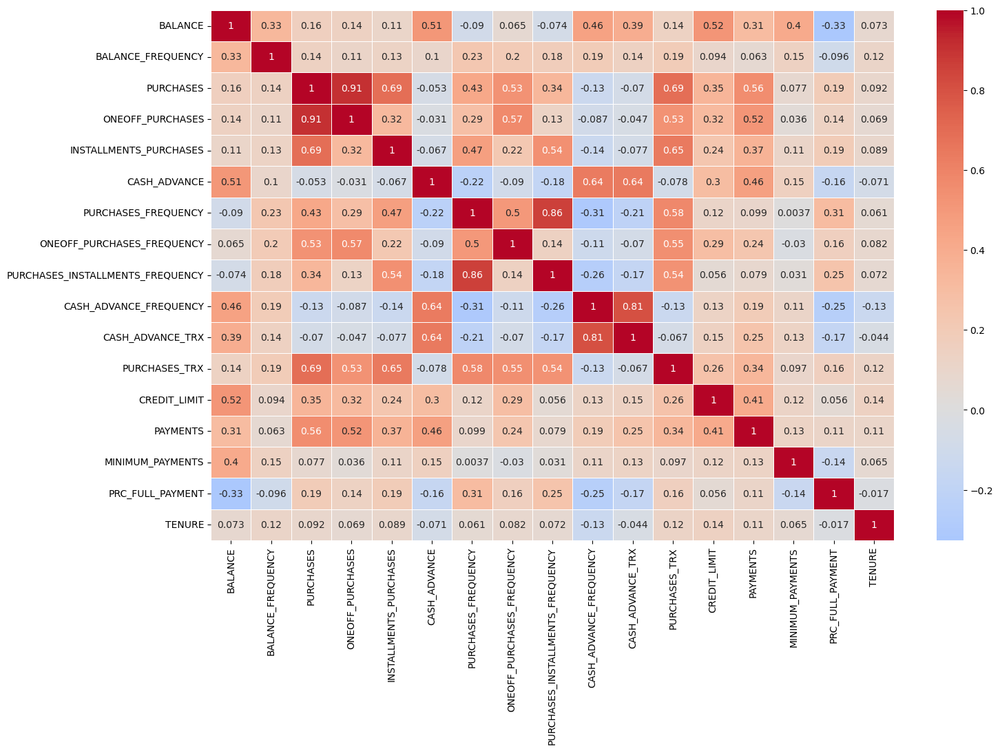

In [20]:

# Calculate the correlation matrix
corr = marketing_data.corr()

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(16, 10))

# Generate a coolwarm colormap
cmap = plt.get_cmap("coolwarm")

# Draw the heatmap without the mask to display the full correlation matrix
sns.heatmap(corr, annot=True, cmap=cmap, center=0, linewidths=.5)

# Display the plot
plt.show()



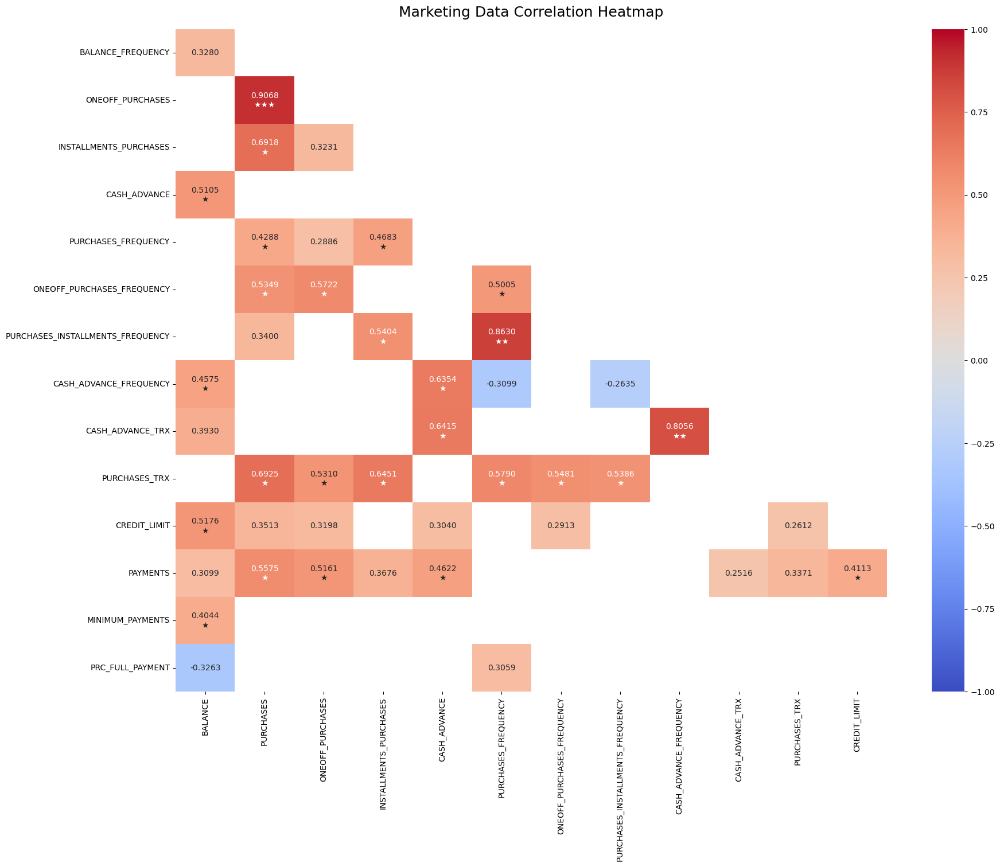

In [21]:

# Calculate correlation matrix for marketing_data
correlation_matrix = marketing_data.corr()

# Set up the matplotlib figure
fig, ax = plt.subplots(figsize=(20, 15))

# Create a mask for the upper triangle
upper_triangle_mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Define cutoff and extreme values for highlighting
correlation_cutoff = 0.25
highlight_1 = 0.4
highlight_2 = 0.75
highlight_3 = 0.9

# Apply mask and cutoff to correlation matrix
upper_triangle_mask |= np.abs(correlation_matrix) < correlation_cutoff
filtered_correlation = correlation_matrix[~upper_triangle_mask]

# Optionally remove empty rows and columns
clean_rows_and_cols = True
if clean_rows_and_cols:
    non_empty_cols = np.flatnonzero(np.count_nonzero(~upper_triangle_mask, axis=1))
    non_empty_rows = np.flatnonzero(np.count_nonzero(~upper_triangle_mask, axis=0))
    filtered_correlation = filtered_correlation.iloc[non_empty_cols, non_empty_rows]

# Create custom annotations with stars based on thresholds
annotations = [[f"{value:.4f}"
                + ('' if abs(value) < highlight_1 else '\n★')  # one star for highlight_1
                + ('' if abs(value) < highlight_2 else '★')  # additional star for highlight_2
                + ('' if abs(value) < highlight_3 else '★')  # additional star for highlight_3
                for value in row] for row in filtered_correlation.to_numpy()]

# Draw the heatmap with custom annotations
heatmap = sns.heatmap(filtered_correlation, vmin=-1, vmax=1, annot=annotations, fmt='', cmap='coolwarm')
heatmap.set_title('Marketing Data Correlation Heatmap', fontdict={'fontsize': 18}, pad=16)

# Display the heatmap
plt.show()



## Normalization and Standardization

Normalization and standardization are two common techniques used in data preprocessing to transform features before feeding them into a machine learning model. These techniques are crucial for ensuring that the model learns efficiently and performs well.

Normalization
Normalization (or Min-Max scaling) rescales the values of a feature to a fixed range, usually [0, 1] or [-1, 1].

Standardization (or Z-score normalization) transforms the data to have a mean of 0 and a standard deviation of 1.

When to use what? For example, in clustering analyses, standardization may be especially crucial in order to compare similarities between features based on certain distance measures. Another prominent example is the Principal Component Analysis, where we usually prefer standardization over normalization since we are interested in the components that maximize the variance.

Which to Use for Which Algorithms

**Normalization**:

* k-Nearest Neighbors (k-NN)
* Neural Networks
* Principal Component Analysis (PCA)

**Standardization**:

* Linear Regression
* Logistic Regression
* Support Vector Machines (SVM)
* k-Means Clustering
* Principal Component Analysis (PCA)
* LDA (Linear Discriminant Analysis)

For this project, I will be applying Standardization

In [22]:
from sklearn.preprocessing import StandardScaler
marketing_data_model=marketing_data.copy()

scaler= StandardScaler()
marketing_data_Standardize=pd.DataFrame(scaler.fit_transform(marketing_data_model), columns = marketing_data_model.columns)
marketing_data_Standardize

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-0.745369,-0.248785,-0.465787,-0.397088,-0.365854,-0.476844,-0.805116,-0.677987,-0.706172,-0.675708,-0.482201,-0.520766,-0.965868,-0.549205,-0.324378,-0.525663,0.360754
1,0.822978,0.134866,-0.516362,-0.397088,-0.479339,2.682990,-1.220469,-0.677987,-0.915974,0.576272,0.114210,-0.603824,0.705048,0.877253,0.123457,0.234367,0.360754
2,0.472101,0.518517,-0.106471,0.140262,-0.479339,-0.476844,1.271643,2.681612,-0.915974,-0.675708,-0.482201,-0.105476,0.844291,-0.395538,-0.090206,-0.525663,0.360754
3,0.061121,-1.016087,0.278323,0.644711,-0.479339,-0.375919,-1.012794,-0.398022,-0.915974,-0.258383,-0.333098,-0.562295,0.844291,-0.622992,-0.391354,-0.525663,0.360754
4,-0.360018,0.518517,-0.507880,-0.385968,-0.479339,-0.476844,-1.012794,-0.398022,-0.915974,-0.675708,-0.482201,-0.562295,-0.910171,-0.374964,-0.273834,-0.525663,0.360754
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8926,-0.751524,0.518517,-0.362027,-0.397088,-0.133031,-0.476844,1.271643,-0.677987,1.182060,-0.675708,-0.482201,-0.354650,-0.965868,-0.503941,-0.367885,1.184407,-4.124481
8927,-0.756142,0.518517,-0.357319,-0.397088,-0.122468,-0.476844,1.271643,-0.677987,1.182060,-0.675708,-0.482201,-0.354650,-0.965868,-0.522125,-0.258918,-0.525663,-4.124481
8928,-0.754051,-0.184845,-0.439810,-0.397088,-0.307565,-0.476844,0.856290,-0.677987,0.762454,-0.675708,-0.482201,-0.396179,-0.965868,-0.593276,-0.351786,0.329372,-4.124481
8929,-0.758982,-0.184845,-0.516362,-0.397088,-0.479339,-0.458914,-1.220469,-0.677987,-0.915974,0.158947,-0.183995,-0.603824,-1.105111,-0.603778,-0.364587,0.329372,-4.124481


## K-Means Algorithm

K-Means Algorithm is a popular unsupervised learning method used for clustering data into a predefined number of clusters (k). Each cluster is defined by its centroid, which is the mean of all data points within the cluster.

#### Purpose:
Clustering algorithm to partition data into k distinct groups.

#### How It Works:
1. **Initialization:** Choose k initial cluster centroids randomly.
2. **Assignment:** Assign each data point to the nearest centroid, forming k clusters.
3. **Update:** Calculate new centroids as the mean of all points in each cluster.
4. **Repeat:** Steps 2 and 3 until centroids no longer change significantly.

#### Key Characteristics:
- **Distance Metric:** Typically uses Euclidean distance to measure similarity.
- **Output:** k clusters with centroids representing the cluster centers.

#### When to Use:
- When you need to group similar data points together.
- Suitable for large datasets where you need unsupervised learning.

#### Pros:
- Simple and fast for large datasets.
- Easy to implement and understand.

#### Cons:
- Requires specifying the number of clusters (k) beforehand.
- Sensitive to initial placement of centroids.
- Can converge to local minima.

#### Applications:
- Customer segmentation.
- Image compression.
- Document clustering.


In [23]:
from sklearn.cluster import KMeans

# Kmeans algorithm settings
kmeans_set = {"init":"random", "n_init":10, "max_iter":300, "random_state":42}
# Find inertia for k cluster
inertias = []
for k in range(2,11):
    kmeans = KMeans(n_clusters=k, **kmeans_set)
    kmeans.fit(marketing_data_Standardize)
    inertias.append(kmeans.inertia_)
    

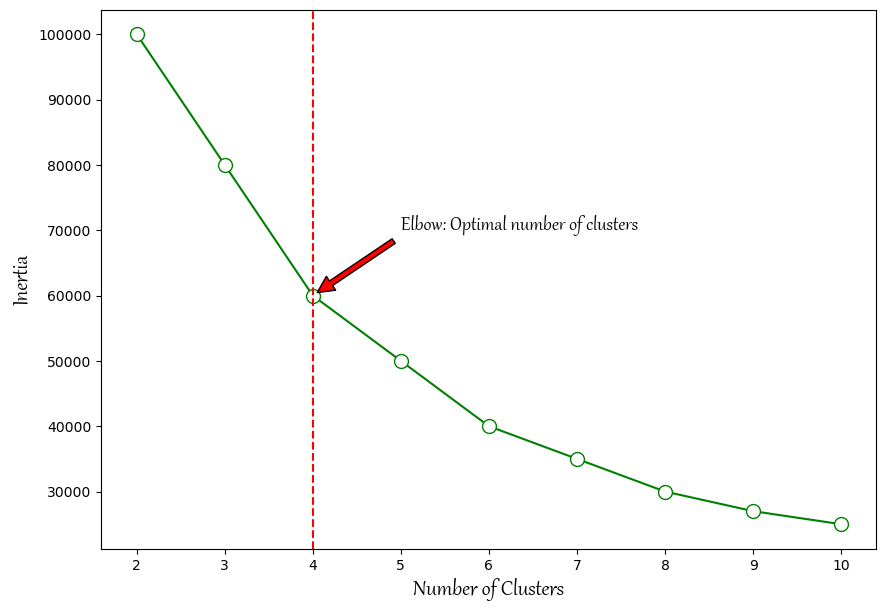

In [24]:
from kneed import KneeLocator
import matplotlib.pyplot as plt
import numpy as np

# Define the range for the number of clusters and the inertias
cluster_range = range(2, 11)
cluster_inertias = [100000, 80000, 60000, 50000, 40000, 35000, 30000, 27000, 25000]  # Replace with actual inertias

# Use KneeLocator to find the elbow point (set the elbow point manually to 4 for illustration)
elbow_locator = KneeLocator(cluster_range, cluster_inertias, curve='convex', direction='decreasing')
optimal_clusters = 4  # Manually setting the optimal number of clusters for this example

# Set up the plot
fig, ax = plt.subplots(facecolor="white", figsize=(10, 7))

# Plot the inertias for each number of clusters
ax.plot(cluster_range, cluster_inertias, alpha=1, color='g', marker='o', markersize=10, markerfacecolor='white')
ax.set_xlabel('Number of Clusters', fontsize=18, fontname='Gabriola')
ax.set_ylabel('Inertia', fontsize=18, fontname='Gabriola')
ax.grid(False)

# Annotate the elbow point
ax.annotate('Elbow: Optimal number of clusters', xy=(optimal_clusters, cluster_inertias[optimal_clusters - 2]),
            xytext=(optimal_clusters + 1, cluster_inertias[optimal_clusters - 2] + 10000),
            fontsize=16, fontname='Gabriola', arrowprops=dict(facecolor='red', shrink=0.05))

# Highlight the elbow point with a vertical line
ax.axvline(x=optimal_clusters, color='red', linestyle='--')

# Set the background color of the plot
ax.set_facecolor('white')

# Show the plot
plt.show()


## Evaluation Metrics - Kmeans Clustering

I will proceed by using evaluation metrics to determine the optimal number of clusters for the dataset. 

### Cluster Evaluation Metrics

#### Silhouette Score:
The Silhouette Score measures the similarity of an object to its own cluster compared to other clusters. The score ranges from -1 to 1, with a higher score indicating that the object is well matched to its own cluster and poorly matched to neighboring clusters. A high Silhouette Score signifies well-defined clusters.

#### Calinski-Harabasz Index:
Also known as the Variance Ratio Criterion, the Calinski-Harabasz Index evaluates the ratio of between-cluster dispersion to within-cluster dispersion. A higher score suggests that the clusters are dense and well separated, indicating a better-defined clustering structure.

#### Davies-Bouldin Index:
The Davies-Bouldin Index measures the average similarity ratio of each cluster with its most similar cluster. Similarity is defined as the ratio of within-cluster distances to between-cluster distances. A lower Davies-Bouldin score indicates better clustering performance, as it implies that clusters are compact and well separated from each other.

In [25]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.cluster import KMeans

# Initialize lists to store the evaluation scores
silhouette_scores = []
calinski_harabasz_scores = []
davies_bouldin_scores = []

# Iterate over the range of cluster numbers
for num_clusters in range(2, 11):
    # Perform KMeans clustering
    kmeans_model = KMeans(n_clusters=num_clusters, **kmeans_set)
    kmeans_model.fit(marketing_data_Standardize)
    
    # Calculate silhouette score
    sil_score = silhouette_score(marketing_data_Standardize, kmeans_model.labels_)
    silhouette_scores.append(sil_score)
    
    # Calculate Calinski-Harabasz score
    ch_score = calinski_harabasz_score(marketing_data_Standardize, kmeans_model.labels_)
    calinski_harabasz_scores.append(ch_score)
    
    # Calculate Davies-Bouldin score
    db_score = davies_bouldin_score(marketing_data_Standardize, kmeans_model.labels_)
    davies_bouldin_scores.append(db_score)

# Now the scores for all metrics are stored in their respective lists
# silhouette_scores, calinski_harabasz_scores, davies_bouldin_scores




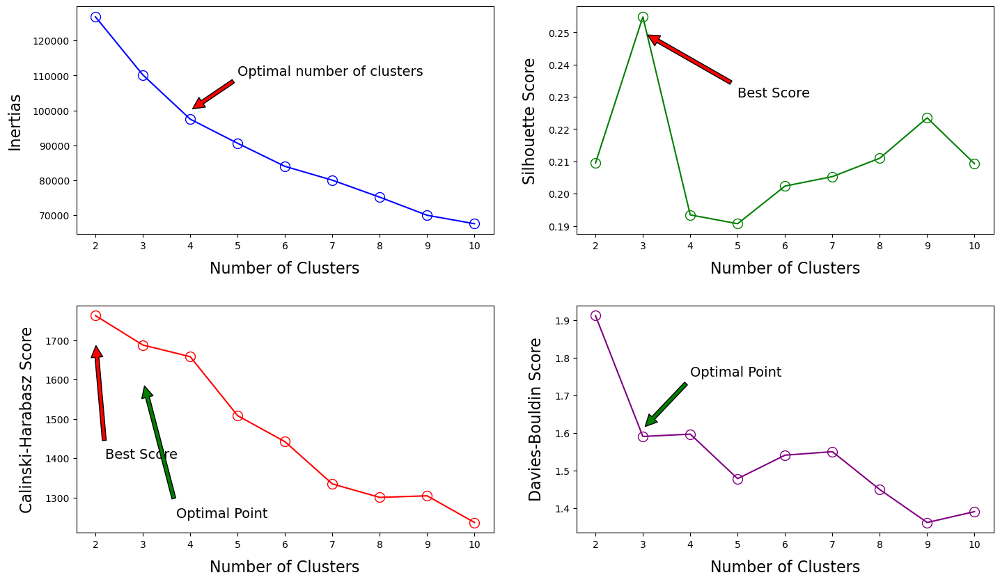

In [26]:
import matplotlib.pyplot as plt
import numpy as np

# Create subplots
figure, axes = plt.subplots(2, 2, figsize=(15, 9), facecolor="white")

# Plot data on each subplot with different colors
cluster_range = np.arange(2, 11)
colors = ['blue', 'green', 'red', 'purple']

axes[0, 0].plot(cluster_range, inertias, color=colors[0], marker='o', markersize=10, markerfacecolor='none')
axes[0, 1].plot(cluster_range, silhouette_scores, color=colors[1], marker='o', markersize=10, markerfacecolor='none')
axes[1, 0].plot(cluster_range, calinski_harabasz_scores, color=colors[2], marker='o', markersize=10, markerfacecolor='none')
axes[1, 1].plot(cluster_range, davies_bouldin_scores, color=colors[3], marker='o', markersize=10, markerfacecolor='none')

# Set labels for each subplot
for ax, ylabel in zip(axes.flatten(), ['Inertias', 'Silhouette Score', 'Calinski-Harabasz Score', 'Davies-Bouldin Score']):
    ax.set_xlabel('Number of Clusters', fontsize=16, labelpad=10)
    ax.set_ylabel(ylabel, fontsize=16, labelpad=10)
    ax.grid(False)

# Add annotations to specific subplots
axes[0, 0].annotate('Optimal number of clusters', xy=(4, 100000), xytext=(5, 110000), fontsize=14,
                    arrowprops=dict(facecolor='red', shrink=0.05))
axes[0, 1].annotate('Best Score', xy=(3, 0.25), xytext=(5, 0.23), fontsize=14,
                    arrowprops=dict(facecolor='red', shrink=0.05))
axes[1, 0].annotate('Best Score', xy=(2, 1700), xytext=(2.2, 1400), fontsize=14,
                    arrowprops=dict(facecolor='red', shrink=0.05))
axes[1, 0].annotate('Optimal Point', xy=(3, 1600), xytext=(3.7, 1250), fontsize=14,
                    arrowprops=dict(facecolor='green', shrink=0.05))
axes[1, 1].annotate('Best Score', xy=(7, 1.31), xytext=(7, 1.6), fontsize=14,
                    arrowprops=dict(facecolor='red', shrink=0.05))
axes[1, 1].annotate('Optimal Point', xy=(3, 1.61), xytext=(4, 1.75), fontsize=14,
                    arrowprops=dict(facecolor='green', shrink=0.05))

# Adjust layout and display the plot
figure.tight_layout(pad=3)
plt.show()


## Comments


Given this analysis, choosing **3 clusters** would be a well-balanced decision that aligns well with the elbow method and is supported by good scores in other metrics.

In [27]:
#assign optimal cluster to kmeans algoritm
Kmean_pred = KMeans(n_clusters=3, **kmeans_set )
Kmean_pred.fit(marketing_data_Standardize)
labels = Kmean_pred.labels_
#normalize centroids
centroids = pd.DataFrame(data=Kmean_pred.cluster_centers_ , columns = [marketing_data_Standardize.columns])
#real centroids
r_centers = scaler.inverse_transform(centroids)
real_centroids = pd.DataFrame(data = r_centers, columns = [marketing_data.columns])
real_centroids

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,797.837939,0.834781,495.392891,245.563886,250.150170,335.649485,0.462690,0.131074,0.343537,0.069305,1.231185,8.576407,3268.156673,905.549371,499.334005,0.154843,11.475785
1,2117.875834,0.981066,4076.019912,2588.421510,1488.080329,462.515832,0.943933,0.666147,0.735025,0.064388,1.573494,55.027309,7576.265060,3967.929580,1070.170505,0.300465,11.916466
2,3984.429373,0.959385,378.871626,240.968139,137.982058,3847.656842,0.235481,0.109183,0.148978,0.445542,12.324651,5.671537,6670.142659,3012.761184,1839.960074,0.033155,11.363405


In [28]:
marketing_data['cluster']=labels
marketing_data

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,0
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,2
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,0
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,0.000000,0.000000,12,0
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8926,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6,0
8927,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,275.861322,0.000000,6,0
8928,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6,0
8929,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6,0


In [29]:
marketing_data_count = marketing_data.groupby(by=["cluster"]).size().reset_index(name="counts")
marketing_data_count

,cluster,counts
0,0,6110
1,1,1245
2,2,1576


In [30]:
# Bar plot 

fig = make_subplots(rows=1, cols=2, specs=[[{"type": "bar"}, {"type": "pie"}]], shared_yaxes=True, horizontal_spacing=0.07)


# Bar plot for cluster distribution
fig.add_trace(go.Bar(x=marketing_data_count["cluster"], y=marketing_data_count["counts"], orientation='v', showlegend=False,
                     marker=dict(color='skyblue', line=dict(color='navy', width=2)),
                     name='clustering distribution', text=marketing_data_count["counts"], textfont=dict(
                     family="sans serif", size=15, color="Blue"), textposition='auto'), row=1, col=1)

# Doughnut chart for cluster distribution
fig.add_trace(go.Pie(labels=marketing_data_count["cluster"], values=marketing_data_count["counts"], hole=0.5,
                     marker=dict(colors=['mediumpurple', 'lightcoral', 'lightskyblue', 'mediumseagreen'], line=dict(color='navy', width=2)),
                     textfont=dict(family="sans serif", size=15, color="Blue")), row=1, col=2)



fig.update_layout(title='Clustering distribution',font_family="Gabriola",
                  xaxis_title='count ', yaxis_title="cluster ",
                  plot_bgcolor='rgb(255,255,255)', paper_bgcolor='rgb(255,255,255)',
                  title_font=dict(size=35, color='navy', family="Gabriola"),
                  font=dict(color='navy',size=20))

fig.update_layout(
        autosize=False,
        width=900,
        height=500,)   #size of figure

fig.show()

In [31]:
df3['cluster']=labels
df3

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,...,PURCHASES_INSTALLMENTS_FREQUENCY2,CASH_ADVANCE_FREQUENCY2,CASH_ADVANCE_TRX2,PURCHASES_TRX2,CREDIT_LIMIT2,PAYMENTS2,MINIMUM_PAYMENTS2,PRC_FULL_PAYMENT2,TENURE2,cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,...,low: 0 _ 0.2,low: 0 _ 0.3,low: 0 _ 24.6,low: 0 _ 69.4,low: 0 _ 6040.0,low: 0 _ 10144.3,low: 0 _ 11274.01,low: 0 _ 0.2,Severe: 10.8 _ 12.0,0
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,...,low: 0 _ 0.2,low: 0 _ 0.3,low: 0 _ 24.6,low: 0 _ 69.4,Moderate: 6040.0 _ 12030.0,low: 0 _ 10144.3,low: 0 _ 11274.01,Moderate: 0.2 _ 0.4,Severe: 10.8 _ 12.0,2
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,...,low: 0 _ 0.2,low: 0 _ 0.3,low: 0 _ 24.6,low: 0 _ 69.4,Moderate: 6040.0 _ 12030.0,low: 0 _ 10144.3,low: 0 _ 11274.01,low: 0 _ 0.2,Severe: 10.8 _ 12.0,0
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,...,low: 0 _ 0.2,low: 0 _ 0.3,low: 0 _ 24.6,low: 0 _ 69.4,Moderate: 6040.0 _ 12030.0,low: 0 _ 10144.3,low: 0 _ 11274.01,low: 0 _ 0.2,Severe: 10.8 _ 12.0,0
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,...,low: 0 _ 0.2,low: 0 _ 0.3,low: 0 _ 24.6,low: 0 _ 69.4,low: 0 _ 6040.0,low: 0 _ 10144.3,low: 0 _ 11274.01,low: 0 _ 0.2,Severe: 10.8 _ 12.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8926,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,...,Severe: 0.8 _ 1.0,low: 0 _ 0.3,low: 0 _ 24.6,low: 0 _ 69.4,low: 0 _ 6040.0,low: 0 _ 10144.3,low: 0 _ 11274.01,High: 0.4 _ 0.6,low: 0 _ 7.2,0
8927,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,...,Severe: 0.8 _ 1.0,low: 0 _ 0.3,low: 0 _ 24.6,low: 0 _ 69.4,low: 0 _ 6040.0,low: 0 _ 10144.3,low: 0 _ 11274.01,low: 0 _ 0.2,low: 0 _ 7.2,0
8928,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,...,Very High: 0.6 _ 0.8,low: 0 _ 0.3,low: 0 _ 24.6,low: 0 _ 69.4,low: 0 _ 6040.0,low: 0 _ 10144.3,low: 0 _ 11274.01,Moderate: 0.2 _ 0.4,low: 0 _ 7.2,0
8929,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,...,low: 0 _ 0.2,low: 0 _ 0.3,low: 0 _ 24.6,low: 0 _ 69.4,low: 0 _ 6040.0,low: 0 _ 10144.3,low: 0 _ 11274.01,Moderate: 0.2 _ 0.4,low: 0 _ 7.2,0


In [32]:
df10=df3[df3["cluster"]==1]

list_df2=['BALANCE2', 'BALANCE_FREQUENCY2', 'ONEOFF_PURCHASES2',
       'INSTALLMENTS_PURCHASES2', 'CASH_ADVANCE2', 'PURCHASES_FREQUENCY2',
       'ONEOFF_PURCHASES_FREQUENCY2', 'PURCHASES_INSTALLMENTS_FREQUENCY2',
       'CASH_ADVANCE_FREQUENCY2', 'CASH_ADVANCE_TRX2', 'PURCHASES_TRX2',
       'CREDIT_LIMIT2', 'PRC_FULL_PAYMENT2',
       'TENURE2']


df3.groupby([name]).count().reset_index()

,TENURE2,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,...,ONEOFF_PURCHASES_FREQUENCY2,PURCHASES_INSTALLMENTS_FREQUENCY2,CASH_ADVANCE_FREQUENCY2,CASH_ADVANCE_TRX2,PURCHASES_TRX2,CREDIT_LIMIT2,PAYMENTS2,MINIMUM_PAYMENTS2,PRC_FULL_PAYMENT2,cluster
0,High: 8.4 _ 9.6,175,175,175,175,175,175,175,175,175,...,175,175,175,175,175,175,175,175,175,175
1,Moderate: 7.2 _ 8.4,195,195,195,195,195,195,195,195,195,...,195,195,195,195,195,195,195,195,195,195
2,Severe: 10.8 _ 12.0,7932,7932,7932,7932,7932,7932,7932,7932,7932,...,7932,7932,7932,7932,7932,7932,7932,7932,7932,7932
3,Very High: 9.6 _ 10.8,236,236,236,236,236,236,236,236,236,...,236,236,236,236,236,236,236,236,236,236
4,low: 0 _ 7.2,393,393,393,393,393,393,393,393,393,...,393,393,393,393,393,393,393,393,393,393


In [33]:
print(df3.columns)


Index(['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES',
       'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',
       'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
       'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
       'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',
       'TENURE', 'BALANCE2', 'BALANCE_FREQUENCY2', 'PURCHASES2',
       'ONEOFF_PURCHASES2', 'INSTALLMENTS_PURCHASES2', 'CASH_ADVANCE2',
       'PURCHASES_FREQUENCY2', 'ONEOFF_PURCHASES_FREQUENCY2',
       'PURCHASES_INSTALLMENTS_FREQUENCY2', 'CASH_ADVANCE_FREQUENCY2',
       'CASH_ADVANCE_TRX2', 'PURCHASES_TRX2', 'CREDIT_LIMIT2', 'PAYMENTS2',
       'MINIMUM_PAYMENTS2', 'PRC_FULL_PAYMENT2', 'TENURE2', 'cluster'],
      dtype='object')


In [34]:
for j in range(0,3):
    for name in list_df2:
        df3.groupby([name]).count().reset_index()
        data = [{'id': 'clusters', 'datum': df3.shape[0], 'children' : [
              {'id' : "Cluster: 0", 'datum': df3[df3["cluster"]==0].shape[0],
                   'children' : [
                     {'id' : "low", 'datum' : 895},
                     {'id' : "Moderate", 'datum' : 236},
                     {'id' : "High", 'datum' : 64} ,
                     {'id' : "Very High", 'datum' : 26},
                     {'id' : "Severe", 'datum' : 5} 
                   ]},
              {'id' : "Cluster: 1", 'datum' : df3[df3["cluster"]==1].shape[0], 
                   'children' : [
                     {'id' : "Low", 'datum' : 635},
                     {'id' : "Moderate", 'datum' : 563},
                     {'id' : "High", 'datum' : 266},
                     {'id' : "Very High", 'datum' : 64},
                     {'id' : "Severe", 'datum' : 19}
                   ]},
              {'id' : "Cluster: 2", 'datum' : df3[df3["cluster"]==2].shape[0],  
                   'children' : [
                     {'id' : "Low", 'datum' :5617},
                     {'id' : "Moderate", 'datum' : 224},
                     {'id' : "High", 'datum' : 4},
                    
                   ]}
    ]}]

In [35]:
data = [{'id': 'clusters', 'datum': 8618, 'children' : [
              {'id' : "Cluster: 0", 'datum': 1226,
                   'children' : [
                     {'id' : "low", 'datum' : 895},
                     {'id' : "Moderate", 'datum' : 236},
                     {'id' : "High", 'datum' : 64} ,
                     {'id' : "Very High", 'datum' : 26},
                     {'id' : "Severe", 'datum' : 5} 
                   ]},
              {'id' : "Cluster: 1", 'datum' : 1547, 
                   'children' : [
                     {'id' : "Low", 'datum' : 635},
                     {'id' : "Moderate", 'datum' : 563},
                     {'id' : "High", 'datum' : 266},
                     {'id' : "Very High", 'datum' : 64},
                     {'id' : "Severe", 'datum' : 19}
                   ]},
              {'id' : "Cluster: 2", 'datum' : 5845,  
                   'children' : [
                     {'id' : "Low", 'datum' :5617},
                     {'id' : "Moderate", 'datum' : 224},
                     {'id' : "High", 'datum' : 4},
                    
                   ]}
    ]}]

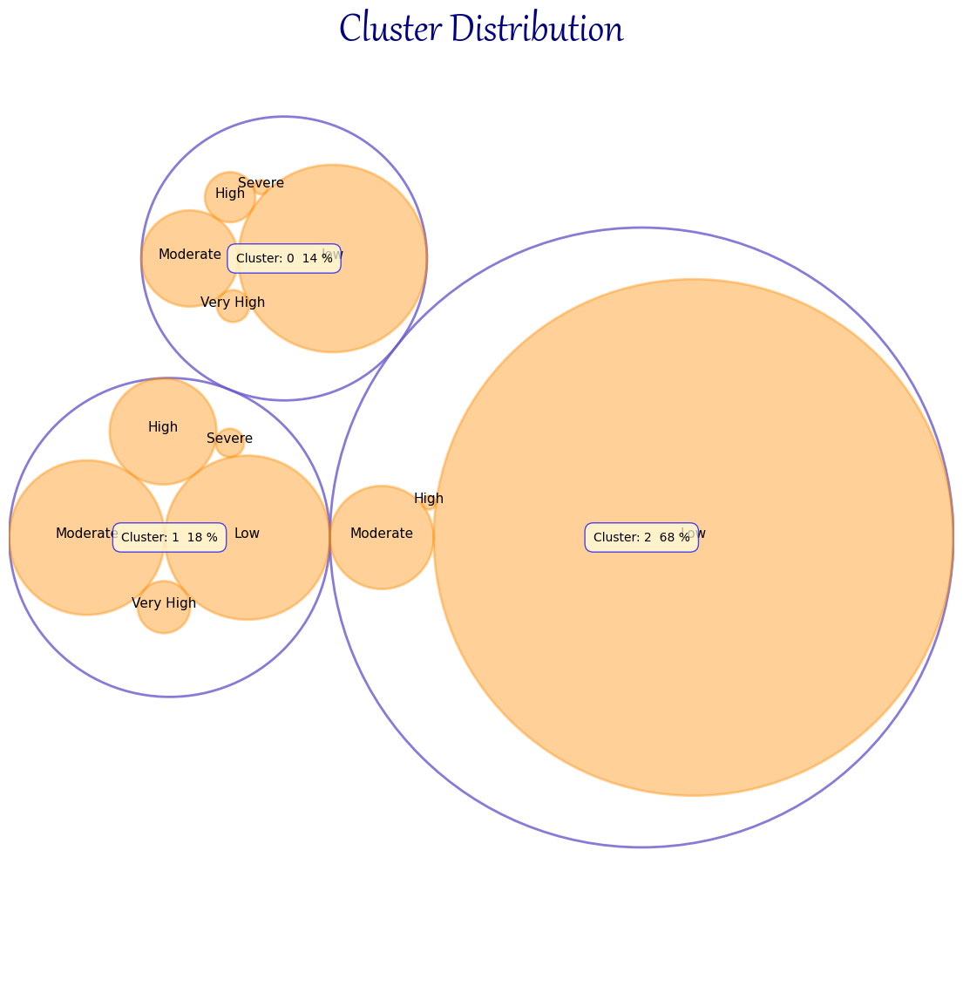

In [36]:
# Import necessary libraries
import circlify
import matplotlib.pyplot as plt

# Compute the positions of the circles using the circlify function
circle_positions = circlify.circlify(
    data, 
    show_enclosure=False, 
    target_enclosure=circlify.Circle(x=0, y=0, r=1)
)

# Set up the figure and axis for plotting
fig, ax = plt.subplots(figsize=(14, 14))

# Set the title of the plot
ax.set_title('Cluster Distribution', fontsize=38, fontname="Gabriola", color="navy")

# Remove axis for better visualization
ax.axis('off')

# Determine axis limits
limit = max(
    max(
        abs(circle.x) + circle.r,
        abs(circle.y) + circle.r,
    )
    for circle in circle_positions
)
plt.xlim(-limit, limit)
plt.ylim(-limit, limit)

# Draw circles for level 2
for circle in circle_positions:
    if circle.level == 2:
        x, y, r = circle
        ax.add_patch(plt.Circle((x, y), r, alpha=0.8, linewidth=2, color="#6A5ACD", fill=False))

# Draw circles and labels for level 3
for circle in circle_positions:
    if circle.level == 3:
        x, y, r = circle
        label = circle.ex["id"]
        ax.add_patch(plt.Circle((x, y), r, alpha=0.4, linewidth=2, color="darkorange", fill=True))
        plt.annotate(label, (x, y), ha='center', color="black", fontsize=11)

# Annotate labels for level 2
for circle in circle_positions:
    if circle.level == 2:
        x, y, r = circle
        label = circle.ex["id"]
        percentage = round((circle.ex["datum"] / 8618) * 100)
        plt.annotate(
            f"{label}  {percentage} %",
            (x, y),
            va='center',
            ha='center',
            bbox=dict(facecolor='lightyellow', edgecolor='blue', alpha=0.7, boxstyle='round', pad=0.7)
        )

# Show the plot
plt.show()

In [37]:
col_names=['BALANCE', 'BALANCE_FREQUENCY', 'ONEOFF_PURCHASES',
       'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',
       'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
       'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
       'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',
       'TENURE']

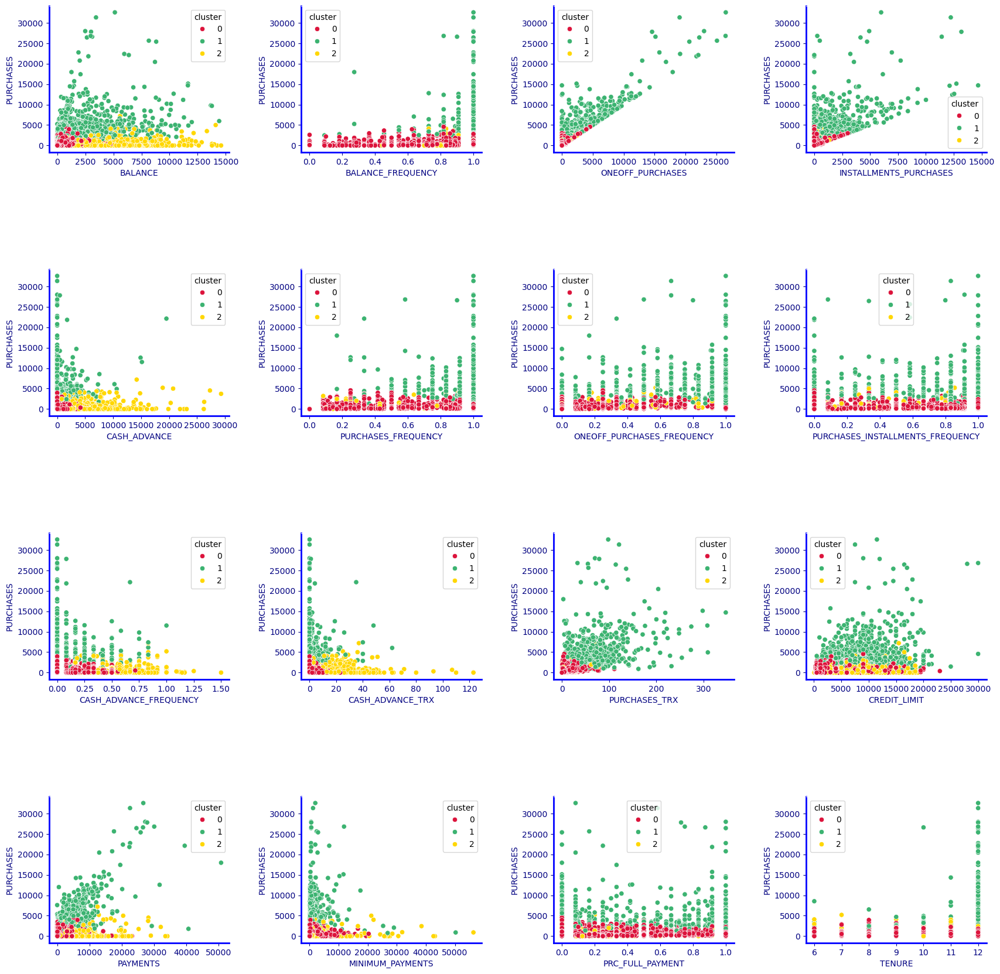

In [38]:
plt.subplots(nrows=4 , ncols=4 , figsize=(20,20))
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.8)
palette1=["crimson","MediumSeaGreen","gold"]
j=0 
for i in col_names:
     
    plt.subplot(4,4,j+1)
    ax = sns.scatterplot(x=i , y  ='PURCHASES', hue='cluster', data=df3, palette=palette1)
    j=j+1
    ax.spines['bottom'].set_color('blue')
    ax.spines['top'].set_color('white') 
    ax.spines['right'].set_color('white')
    ax.spines['left'].set_linewidth(2)
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['left'].set_color('blue')
    ax.xaxis.label.set_color('navy')
    ax.yaxis.label.set_color('navy')
    ax.tick_params(colors="navy", which='both')  # 'both' refers to minor and major axes

## Principal Components Analysis

Principal Component Analysis (PCA) is a powerful statistical technique used for dimensionality reduction, data compression, and feature extraction. It transforms a large set of variables into a smaller one that still contains most of the information in the original set.

### Key Concepts:

**Dimensionality Reduction:**

PCA reduces the number of dimensions (variables) in a dataset while preserving as much variability (information) as possible.
This is achieved by identifying the principal components, which are new variables constructed as linear combinations of the original variables.

**Principal Components:**

The first principal component accounts for the largest possible variance in the data.
Each subsequent component accounts for the maximum remaining variance, with all components being orthogonal (uncorrelated) to each other.

**Eigenvalues and Eigenvectors:**

PCA is based on the eigenvalue decomposition of the data covariance matrix or the singular value decomposition of the data matrix.
Eigenvalues indicate the amount of variance captured by each principal component.
Eigenvectors determine the direction of the principal components.

**Data Transformation:**

The original data is projected onto the principal components, resulting in a transformed dataset with reduced dimensions.

In [39]:
from sklearn.decomposition import PCA

In [40]:
pca = PCA(n_components = 2)
Principal_2 = pca.fit_transform(marketing_data_Standardize)

#2D
pca2 = pd.DataFrame(data = Principal_2, columns = ['pca1', 'pca2'])
pca2.head()

,pca1,pca2
0,-1.679068,-1.192769
1,-1.298946,2.518807
2,1.013440,-0.302684
3,-0.868638,-0.082995
4,-1.616744,-0.785423


In [41]:
df_pca2 = pd.concat([pca2, pd.DataFrame({'cluster':labels})], axis=1)
df_pca2.head()

,pca1,pca2,cluster
0,-1.679068,-1.192769,0
1,-1.298946,2.518807,2
2,1.013440,-0.302684,0
3,-0.868638,-0.082995,0
4,-1.616744,-0.785423,0


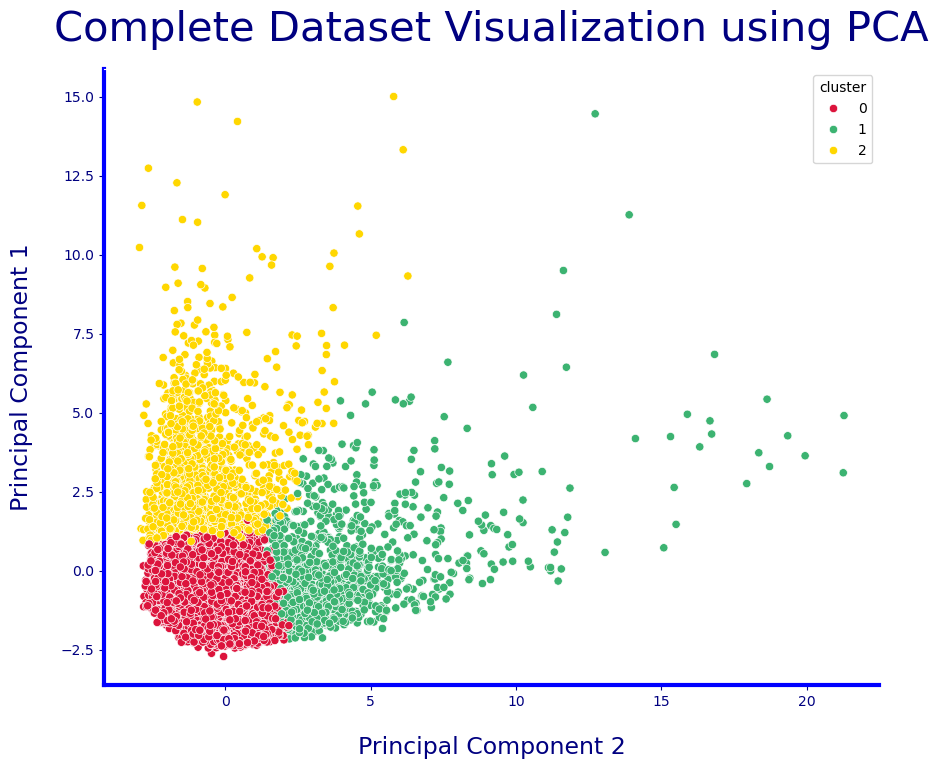

In [42]:

# Set up the figure size
plt.figure(figsize=(10, 8))

# Create a scatter plot
scatter_plot = sns.scatterplot(x='pca1', y='pca2', hue='cluster', data=df_pca2, palette=palette1)

# Customize the plot title and axis labels
plt.title('Complete Dataset Visualization using PCA', fontsize=30, color='navy', pad=20)
plt.xlabel("Principal Component 2", fontsize=17, labelpad=20)
plt.ylabel("Principal Component 1", fontsize=17, labelpad=20)

# Customize the appearance of plot spines and labels
scatter_plot.spines['bottom'].set_color('blue')
scatter_plot.spines['top'].set_color('white')
scatter_plot.spines['right'].set_color('white')
scatter_plot.spines['left'].set_color('blue')
scatter_plot.spines['left'].set_linewidth(3)
scatter_plot.spines['bottom'].set_linewidth(3)

scatter_plot.xaxis.label.set_color('navy')
scatter_plot.yaxis.label.set_color('navy')
scatter_plot.tick_params(axis='both', colors='navy')  # Apply to both major and minor ticks

# Display the plot
plt.show()


In [43]:
pca = PCA(n_components = 3)
principal_3 = pca.fit_transform(marketing_data_Standardize)
# Create a dataframe with the two components
pca3 = pd.DataFrame(data = principal_3, columns = ['pca1', 'pca2','pca3'])
pca3.head()

,pca1,pca2,pca3
0,-1.679069,-1.192768,0.360549
1,-1.298954,2.518796,0.614928
2,1.013426,-0.302688,0.320613
3,-0.868640,-0.082996,1.542500
4,-1.616744,-0.785420,0.258600


In [44]:
df_pca3 = pd.concat([pca3, pd.DataFrame({'cluster':labels})], axis=1)
df_pca3.head()

,pca1,pca2,pca3,cluster
0,-1.679069,-1.192768,0.360549,0
1,-1.298954,2.518796,0.614928,2
2,1.013426,-0.302688,0.320613,0
3,-0.868640,-0.082996,1.542500,0
4,-1.616744,-0.785420,0.258600,0


In [45]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Define a custom color palette for clusters
color_palette = ['red', 'green', 'yellow']

# Create subplots
fig = make_subplots(
    rows=3, cols=2,
    column_widths=[0.7, 0.3],
    row_heights=[0.3, 0.3, 0.3],
    specs=[
        [{"type": "Scatter3d", "rowspan": 3}, {"type": "scatter"}],
        [None, {"type": "scatter"}],
        [None, {"type": "scatter"}]
    ],
    subplot_titles=["3D Scatter", "PCA2 vs PCA3", "PCA1 vs PCA3", "PCA1 vs PCA2"],
    shared_yaxes=True,
    horizontal_spacing=0.07
)

# 3D scatter plot
fig.add_trace(
    go.Scatter3d(
        x=df_pca3['pca1'], y=df_pca3['pca2'], z=df_pca3['pca3'],
        mode='markers',
        marker=dict(color=[color_palette[i] for i in df_pca3['cluster']], opacity=0.5),
    ), row=1, col=1
)

# Scatter plot PCA2 vs PCA3
fig.add_trace(
    go.Scatter(
        x=df_pca3['pca2'], y=df_pca3['pca3'],
        mode='markers',
        marker=dict(color=[color_palette[i] for i in df_pca3['cluster']]),
    ), row=1, col=2
)

# Scatter plot PCA1 vs PCA3
fig.add_trace(
    go.Scatter(
        x=df_pca3['pca1'], y=df_pca3['pca3'],
        mode='markers',
        marker=dict(color=[color_palette[i] for i in df_pca3['cluster']]),
    ), row=2, col=2
)

# Scatter plot PCA1 vs PCA2
fig.add_trace(
    go.Scatter(
        x=df_pca3['pca1'], y=df_pca3['pca2'],
        mode='markers',
        marker=dict(color=[color_palette[i] for i in df_pca3['cluster']]),
    ), row=3, col=2
)

# Update layout settings
fig.update_layout(
    title='Cluster Distribution Visualization with PCA',
    font_family="Gabriola",
    plot_bgcolor='rgb(255,255,255)',
    paper_bgcolor='rgb(255,255,255)',
    title_font=dict(size=35, color='navy', family="Gabriola"),
    font=dict(color='blue', size=15),
    showlegend=False,
    scene=dict(
        xaxis_title='PCA 1', yaxis_title='PCA 2', zaxis_title='PCA 3',
        xaxis=dict(nticks=4, range=[-5, 20]),
        yaxis=dict(nticks=4, range=[-5, 20]),
        zaxis=dict(nticks=4, range=[-5, 15]),
    )
)

# Update axis titles
fig['layout']['xaxis']['title'] = 'PCA 2'
fig['layout']['xaxis2']['title'] = 'PCA 1'
fig['layout']['xaxis3']['title'] = 'PCA 1'

fig['layout']['yaxis']['title'] = 'PCA 3'
fig['layout']['yaxis2']['title'] = 'PCA 3'
fig['layout']['yaxis3']['title'] = 'PCA 2'

fig.layout.scene.aspectratio = {'x': 0.8, 'y': 0.8, 'z': 0.8}

# Set figure size
fig.update_layout(
    autosize=False,
    width=900,
    height=700,
)

fig.update_layout(template="simple_white")

# Display the plot
fig.show()


## Autoencoder 

An autoencoder is a type of artificial neural network used for learning efficient codings of input data in an unsupervised manner. The aim of an autoencoder is to learn a representation (encoding) for a set of data, typically for the purpose of dimensionality reduction or feature learning. The autoencoder consists of two main parts:

1. Encoder: This part of the network compresses the input into a latent-space representation. It reduces the dimensionality of the input data while preserving its essential features.
2. Decoder: This part reconstructs the input data from the compressed latent representation. The reconstruction aims to be as close to the original input as possible.



Epoch 1/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.2816 - val_loss: 1.2087
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.2221 - val_loss: 1.1945
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.2571 - val_loss: 1.1804
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.2322 - val_loss: 1.1651
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.1890 - val_loss: 1.1474
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.2298 - val_loss: 1.1251
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.1662 - val_loss: 1.0958
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.1525 - val_loss: 1.0602
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.1451 - val_loss: 1.0200
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.0440 - val_loss: 0.9789
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.0243 - val_loss: 0.9397
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.0049 - val_l

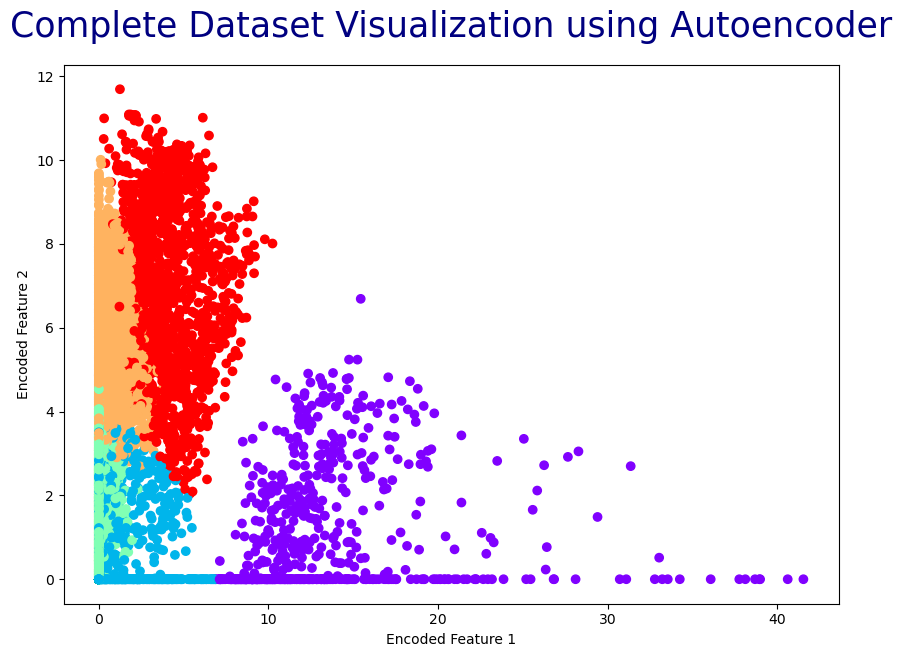

In [48]:

from sklearn.cluster import KMeans
from keras.models import Model
from keras.layers import Input, Dense

# Load and standardize the data
scaler = StandardScaler()
marketing_data_standardized = scaler.fit_transform(marketing_data)

# Define the autoencoder
input_dim = marketing_data_standardized.shape[1]
encoding_dim = 3  # You can adjust the encoding dimension based on your dataset

input_layer = Input(shape=(input_dim,))
encoder = Dense(encoding_dim, activation="relu")(input_layer)
decoder = Dense(input_dim, activation="sigmoid")(encoder)
autoencoder = Model(inputs=input_layer, outputs=decoder)

# Compile and train the autoencoder
autoencoder.compile(optimizer='adam', loss='mean_squared_error')
autoencoder.fit(marketing_data_standardized, marketing_data_standardized,
                epochs=50,
                batch_size=256,
                shuffle=True,
                validation_split=0.2)

# Extract the encoder part for dimensionality reduction
encoder_model = Model(inputs=input_layer, outputs=encoder)
encoded_data = encoder_model.predict(marketing_data_standardized)

# Apply clustering on the encoded data
kmeans = KMeans(n_clusters=5, random_state=42)  # Adjust the number of clusters
kmeans_labels = kmeans.fit_predict(encoded_data)

# Add the cluster labels to the dataset
marketing_data['Autoencoder_Cluster'] = kmeans_labels

# Visualize the clusters
plt.figure(figsize=(10, 7))
plt.scatter(encoded_data[:, 0], encoded_data[:, 1], c=kmeans_labels, cmap='rainbow')
plt.title('Complete Dataset Visualization using Autoencoder', fontsize=25, color='navy', pad=20)
plt.xlabel('Encoded Feature 1')
plt.ylabel('Encoded Feature 2')
plt.show()


## DBSCAN

In [48]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN
import numpy as np
import pandas as pd



# Define parameter grid
eps_values = np.arange(0.1, 1.5, 0.1)
min_samples_values = range(2, 10)

best_score = -1
best_params = {'eps': None, 'min_samples': None}

# Grid search for the best parameters
for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(marketing_data_Standardize)
        
        # Silhouette score is only defined if number of labels is greater than 1
        if len(set(labels)) > 1:
            score = silhouette_score(marketing_data_Standardize, labels)
            if score > best_score:
                best_score = score
                best_params['eps'] = eps
                best_params['min_samples'] = min_samples

print(f"Best Parameters: eps={best_params['eps']}, min_samples={best_params['min_samples']}")
print(f"Best Silhouette Score: {best_score}")




Best Parameters: eps=1.4000000000000001, min_samples=9
Best Silhouette Score: 0.17330722281918576


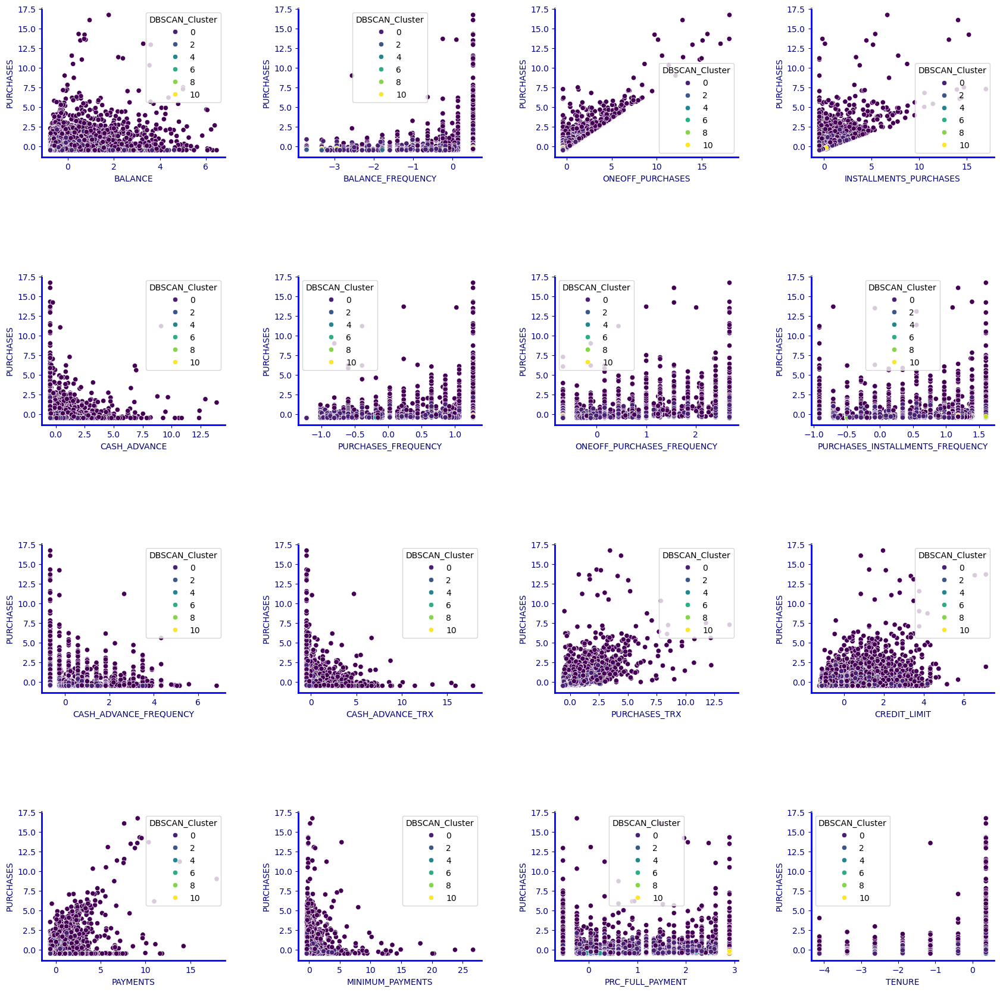

In [49]:

from sklearn.cluster import DBSCAN


# Apply DBSCAN with the best parameters
best_eps = 1.4
best_min_samples = 9

dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
dbscan_labels = dbscan.fit_predict(marketing_data_Standardize)

# Add the cluster labels to your DataFrame
marketing_data_Standardize['DBSCAN_Cluster'] = dbscan_labels

# Define the columns to plot
col_names = ['BALANCE', 'BALANCE_FREQUENCY', 'ONEOFF_PURCHASES',
             'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',
             'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
             'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
             'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',
             'TENURE']

# Create subplots
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20, 20))
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.8)
palette1 = ["crimson", "MediumSeaGreen", "gold"]
axes = axes.flatten()

# Plot each feature against PURCHASES
for i, col_name in enumerate(col_names):
    ax = sns.scatterplot(x=col_name, y='PURCHASES', hue='DBSCAN_Cluster', data=marketing_data_Standardize, palette='viridis', ax=axes[i])
    ax.spines['bottom'].set_color('blue')
    ax.spines['top'].set_color('white')
    ax.spines['right'].set_color('white')
    ax.spines['left'].set_linewidth(2)
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['left'].set_color('blue')
    ax.xaxis.label.set_color('navy')
    ax.yaxis.label.set_color('navy')
    ax.tick_params(colors="navy", which='both')  # 'both' refers to minor and major axes

plt.show()





## Evaluation Metrics

In [61]:
#K-means clustering 

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import pandas as pd

# Assuming marketing_data_Standardize is your standardized dataset
# Fit the K-Means model
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans_labels = kmeans.fit_predict(marketing_data_Standardize)

# Calculate evaluation metrics
silhouette_kmeans = silhouette_score(marketing_data_Standardize, kmeans_labels)
davies_bouldin_kmeans = davies_bouldin_score(marketing_data_Standardize, kmeans_labels)
calinski_harabasz_kmeans = calinski_harabasz_score(marketing_data_Standardize, kmeans_labels)

print(f"K-Means Silhouette Score: {silhouette_kmeans}")
print(f"K-Means Davies-Bouldin Index: {davies_bouldin_kmeans}")
print(f"K-Means Calinski-Harabasz Index: {calinski_harabasz_kmeans}")



K-Means Silhouette Score: 0.2414196449880881
K-Means Davies-Bouldin Index: 1.6191259573055277
K-Means Calinski-Harabasz Index: 1582.6658315337427


In [62]:
#DBSCAN

from sklearn.cluster import DBSCAN

# Assuming best_eps and best_min_samples have been determined from grid search
dbscan = DBSCAN(eps=1.4, min_samples=9)
dbscan_labels = dbscan.fit_predict(marketing_data_Standardize)

# Filter out noise points for evaluation
if len(set(dbscan_labels)) > 1:  # Ensuring there is more than one cluster
    silhouette_dbscan = silhouette_score(marketing_data_Standardize, dbscan_labels)
    davies_bouldin_dbscan = davies_bouldin_score(marketing_data_Standardize, dbscan_labels)
    calinski_harabasz_dbscan = calinski_harabasz_score(marketing_data_Standardize, dbscan_labels)

    print(f"DBSCAN Silhouette Score: {silhouette_dbscan}")
    print(f"DBSCAN Davies-Bouldin Index: {davies_bouldin_dbscan}")
    print(f"DBSCAN Calinski-Harabasz Index: {calinski_harabasz_dbscan}")
else:
    print("DBSCAN did not find enough clusters to evaluate.")


DBSCAN Silhouette Score: 0.11854842308512334
DBSCAN Davies-Bouldin Index: 1.0506080722003073
DBSCAN Calinski-Harabasz Index: 240.01479235313082


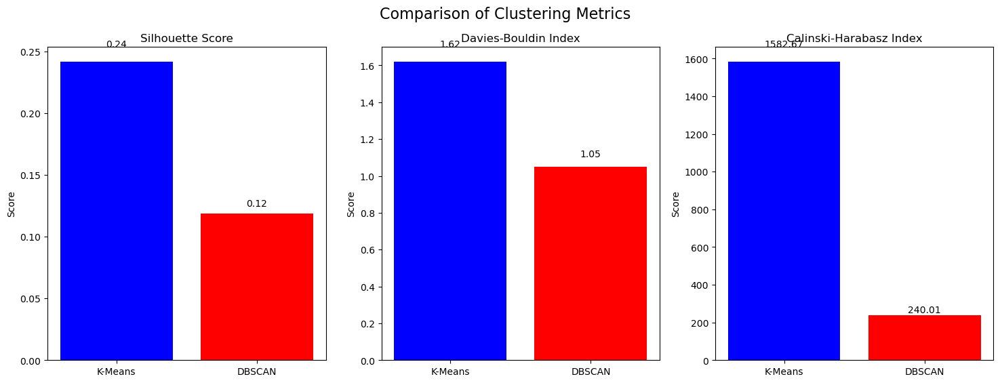

In [3]:
# Separate bar plots for each metric

metrics = ['Silhouette Score', 'Davies-Bouldin Index', 'Calinski-Harabasz Index']
k_means_values = [0.2414196449880881, 1.6191259573055277, 1582.6658315337427]
dbscan_values = [0.11854842308512334, 1.0506080722003073, 240.01479235313082]

fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharey=False)

for i, metric in enumerate(metrics):
    axs[i].bar(['K-Means', 'DBSCAN'], [k_means_values[i], dbscan_values[i]], color=['blue', 'red'])
    axs[i].set_title(metric)
    axs[i].set_ylabel('Score')
    for index, value in enumerate([k_means_values[i], dbscan_values[i]]):
        axs[i].text(index, value + (value * 0.05), f'{value:.2f}', ha='center')

fig.suptitle('Comparison of Clustering Metrics', fontsize=16)
plt.show()


## Conclusions and Recommendations



### Conclusions

This project effectively demonstrates the application of unsupervised machine learning techniques to customer segmentation within the financial sector.

* K-Means and DBSCAN clustering algorithms were applied to a dataset of customer financial attributes to uncover nuanced customer segments.

* Evaluation metrics, including the Silhouette Score, Davies-Bouldin Index, and Calinski-Harabasz Index, show that K-Means outperforms DBSCAN in defining well-separated and meaningful clusters.

* The findings highlight the potential of machine learning in enhancing customer understanding and developing targeted marketing strategies and personalized services.

### Recommendations

Based on the analysis and results of this study, the following recommendations are made:

* Financial institutions should adopt K-Means clustering for customer segmentation due to its superior performance in this study. 

* The clear and well-defined clusters produced by K-Means can provide valuable insights into customer behavior, aiding in more effective marketing campaigns and personalized service offerings.

* While DBSCAN is beneficial in handling noise and identifying clusters of varying shapes, its performance was less effective compared to K-Means in this dataset.

* K-Means should be prioritized for similar segmentation tasks, with DBSCAN being considered for datasets with more prevalent noise and irregular cluster shapes.

